In [173]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from warnings import filterwarnings
from mpl_toolkits.mplot3d import Axes3D
import statsmodels.api as sm
import missingno as msno
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.neighbors import LocalOutlierFactor
from scipy.stats import levene
from scipy.stats import shapiro
from scipy.stats.stats import pearsonr
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.preprocessing import scale
from sklearn.model_selection import ShuffleSplit, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import model_selection
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier, HistGradientBoostingClassifier, VotingClassifier
import xgboost as xgb
from xgboost import XGBRegressor, XGBClassifier
from lightgbm import LGBMRegressor, LGBMClassifier
from catboost import CatBoostRegressor, CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import tree
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.datasets import make_regression
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import log_loss
from sklearn.calibration import CalibrationDisplay, CalibratedClassifierCV
import os
from pygam import GAM, LogisticGAM, s, f, te, l
from sklearn.base import clone

filterwarnings("ignore")

In [7]:
from sklearn import datasets
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC

import datetime

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

sns.set(rc={"figure.dpi":100, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")
from IPython.display import set_matplotlib_formats
%config InlineBackend.figure_format = 'retina'

In [8]:
Pulsar = pd.read_csv("C:/Users/User/Downloads/Compressed/Pulsar.csv")
test = pd.read_csv("C:/Users/User/Downloads/Compressed/test.csv")
sample_submission = pd.read_csv("C:/Users/User/Downloads/Compressed/sample_submission.csv")
train = pd.read_csv("C:/Users/User/Downloads/Compressed/train.csv")

In [9]:
data = Pulsar.copy()
dataV = data.copy()
dataV["Class"] = pd.Categorical(dataV["Class"])
df = data.select_dtypes(include=["float64","int64","int32"])

In [10]:
print(data.shape)

(17898, 9)


In [11]:
print(data.columns)

Index(['Mean_Integrated', 'SD', 'EK', 'Skewness', 'Mean_DMSNR_Curve',
       'SD_DMSNR_Curve', 'EK_DMSNR_Curve', 'Skewness_DMSNR_Curve', 'Class'],
      dtype='object')


In [12]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17898 entries, 0 to 17897
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Mean_Integrated       17898 non-null  float64
 1   SD                    17898 non-null  float64
 2   EK                    17898 non-null  float64
 3   Skewness              17898 non-null  float64
 4   Mean_DMSNR_Curve      17898 non-null  float64
 5   SD_DMSNR_Curve        17898 non-null  float64
 6   EK_DMSNR_Curve        17898 non-null  float64
 7   Skewness_DMSNR_Curve  17898 non-null  float64
 8   Class                 17898 non-null  int64  
dtypes: float64(8), int64(1)
memory usage: 1.2 MB
None


In [13]:
print(data.describe().T)

                        count        mean         std        min         25%   
Mean_Integrated       17898.0  111.079968   25.652935   5.812500  100.929688  \
SD                    17898.0   46.549532    6.843189  24.772042   42.376018   
EK                    17898.0    0.477857    1.064040  -1.876011    0.027098   
Skewness              17898.0    1.770279    6.167913  -1.791886   -0.188572   
Mean_DMSNR_Curve      17898.0   12.614400   29.472897   0.213211    1.923077   
SD_DMSNR_Curve        17898.0   26.326515   19.470572   7.370432   14.437332   
EK_DMSNR_Curve        17898.0    8.303556    4.506092  -3.139270    5.781506   
Skewness_DMSNR_Curve  17898.0  104.857709  106.514540  -1.976976   34.960504   
Class                 17898.0    0.091574    0.288432   0.000000    0.000000   

                             50%         75%          max  
Mean_Integrated       115.078125  127.085938   192.617188  
SD                     46.947479   51.023202    98.778911  
EK                 

In [14]:
print(df.corr())

                      Mean_Integrated        SD        EK  Skewness   
Mean_Integrated              1.000000  0.547137 -0.873898 -0.738775  \
SD                           0.547137  1.000000 -0.521435 -0.539793   
EK                          -0.873898 -0.521435  1.000000  0.945729   
Skewness                    -0.738775 -0.539793  0.945729  1.000000   
Mean_DMSNR_Curve            -0.298841  0.006869  0.414368  0.412056   
SD_DMSNR_Curve              -0.307016 -0.047632  0.432880  0.415140   
EK_DMSNR_Curve               0.234331  0.029429 -0.341209 -0.328843   
Skewness_DMSNR_Curve         0.144033  0.027691 -0.214491 -0.204782   
Class                       -0.673181 -0.363708  0.791591  0.709528   

                      Mean_DMSNR_Curve  SD_DMSNR_Curve  EK_DMSNR_Curve   
Mean_Integrated              -0.298841       -0.307016        0.234331  \
SD                            0.006869       -0.047632        0.029429   
EK                            0.414368        0.432880       -0.341

<Axes: xlabel='Class', ylabel='count'>

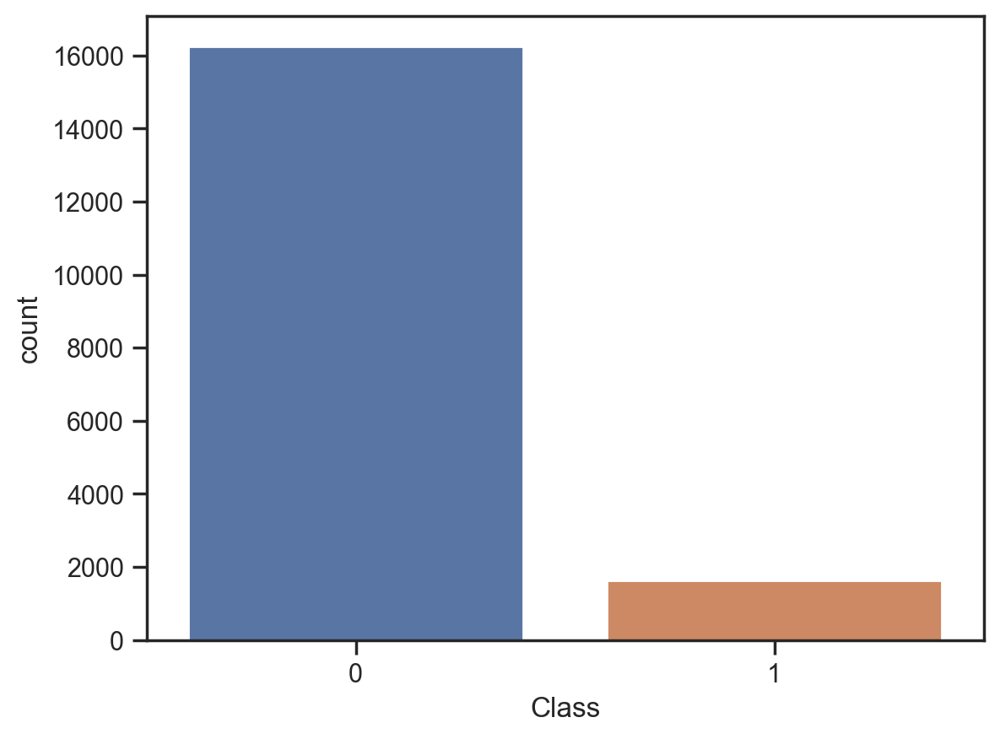

In [15]:
sns.countplot(x = Pulsar['Class'])

In [16]:
print(data.groupby(["Class"])["Mean_Integrated"].mean())

Class
0    116.562726
1     56.690608
Name: Mean_Integrated, dtype: float64


In [17]:
print(data.groupby(["Class"])["SD"].mean())

Class
0    47.339741
1    38.710598
Name: SD, dtype: float64


In [18]:
print(data.groupby(["Class"])["EK"].mean())

Class
0    0.210440
1    3.130655
Name: EK, dtype: float64


In [19]:
print(data.groupby(["Class"])["Skewness"].mean())

Class
0     0.380844
1    15.553576
Name: Skewness, dtype: float64


In [20]:
print(data.groupby(["Class"])["Mean_DMSNR_Curve"].mean())

Class
0     8.863258
1    49.825995
Name: Mean_DMSNR_Curve, dtype: float64


In [21]:
print(data.groupby(["Class"])["SD_DMSNR_Curve"].mean())

Class
0    23.287984
1    56.468963
Name: SD_DMSNR_Curve, dtype: float64


In [22]:
print(data.groupby(["Class"])["EK_DMSNR_Curve"].mean())

Class
0    8.862674
1    2.757069
Name: EK_DMSNR_Curve, dtype: float64


In [23]:
print(data.groupby(["Class"])["Skewness_DMSNR_Curve"].mean())

Class
0    113.620344
1     17.931728
Name: Skewness_DMSNR_Curve, dtype: float64


In [24]:
print(data.where(data["Mean_Integrated"] > 130).value_counts()) # 3546 OBSERVATIONS

Mean_Integrated  SD         EK         Skewness   Mean_DMSNR_Curve  SD_DMSNR_Curve  EK_DMSNR_Curve  Skewness_DMSNR_Curve  Class
130.007812       44.874042  -0.022303   0.474714  1.721572          12.445409       11.569897       177.323185            0.0      1
140.671875       57.514279  -0.101900  -0.583107  15.608696         52.152488       3.531880        11.307220             0.0      1
140.617188       40.862980  -0.122646   0.673756  1.280936          14.507569       13.343646       192.914374            0.0      1
                 41.247940   0.058703   1.153036  1.615385          12.843119       11.720157       172.366780            0.0      1
140.625000       49.007015   0.105725  -0.289984  5.595318          25.877641       5.615847        35.512017             0.0      1
                                                                                                                                  ..
134.671875       43.477025   0.032743   0.401068  3.098662          17.799

In [25]:
print(data.where(data["SD"] > 50).value_counts()) # 5530 OBSERVATIONS

Mean_Integrated  SD         EK         Skewness   Mean_DMSNR_Curve  SD_DMSNR_Curve  EK_DMSNR_Curve  Skewness_DMSNR_Curve  Class
20.789062        53.188147   3.076012   8.005132  148.913880        57.344381       -0.462905       -0.098067             1.0      1
128.109375       58.471980  -0.048897  -0.625732  3.693144          21.671930        6.983961        54.596156            0.0      1
128.148438       51.161370   0.074287  -0.348519  1.190635          15.341119        13.791515       196.972652           0.0      1
128.140625       54.816560  -0.191168  -0.301938  2.030100          18.454113        10.481281       115.808339           0.0      1
                 51.571512  -0.013036  -0.176243  1.731605          13.187826        11.375251       161.515570           0.0      1
                                                                                                                                  ..
117.039062       55.883305   0.231177  -0.601624  11.336120         38.737

In [26]:
print(data.where(data["SD_DMSNR_Curve"] > 30).value_counts()) # 4131 OBSERVATIONS

Mean_Integrated  SD         EK         Skewness    Mean_DMSNR_Curve  SD_DMSNR_Curve  EK_DMSNR_Curve  Skewness_DMSNR_Curve  Class
5.812500         30.631313   7.152691   51.591382  149.070234        47.639920        0.237403        0.127258             1.0      1
122.000000       56.306916   0.192742  -0.676200   18.109532         54.371990        3.107320        8.375608             0.0      1
121.578125       36.198370  -0.054733   1.919365   20.073579         53.629454        2.613956        5.547659             0.0      1
121.593750       51.899458   0.000099  -0.324634   23.942308         58.237872        2.046081        2.272997             0.0      1
121.617188       53.270114  -0.069090  -0.673013   13.025084         38.238265        3.172078        9.945362             0.0      1
                                                                                                                                   ..
85.671875        46.698687   1.084528   1.100297   109.575251      

In [27]:
print(data.isnull().sum()) # No missing value

Mean_Integrated         0
SD                      0
EK                      0
Skewness                0
Mean_DMSNR_Curve        0
SD_DMSNR_Curve          0
EK_DMSNR_Curve          0
Skewness_DMSNR_Curve    0
Class                   0
dtype: int64


Index(['Mean_Integrated', 'SD', 'EK', 'Skewness', 'Mean_DMSNR_Curve',
       'SD_DMSNR_Curve', 'EK_DMSNR_Curve', 'Skewness_DMSNR_Curve', 'Class'],
      dtype='object')

<Axes: xlabel='Mean_Integrated'>

[Text(0.5, 0, 'Mean_Integrated'), Text(0.5, 1.0, 'Standard deviation 25.65')]

<Axes: xlabel='Mean_Integrated', ylabel='Density'>

[Text(0.5, 0, 'Mean_Integrated'), Text(0.5, 1.0, 'Standard deviation 25.65')]

<Axes: xlabel='SD'>

[Text(0.5, 0, 'SD'), Text(0.5, 1.0, 'Standard deviation 6.84')]

<Axes: xlabel='SD', ylabel='Density'>

[Text(0.5, 0, 'SD'), Text(0.5, 1.0, 'Standard deviation 6.84')]

<Axes: xlabel='EK'>

[Text(0.5, 0, 'EK'), Text(0.5, 1.0, 'Standard deviation 1.06')]

<Axes: xlabel='EK', ylabel='Density'>

[Text(0.5, 0, 'EK'), Text(0.5, 1.0, 'Standard deviation 1.06')]

<Axes: xlabel='Skewness'>

[Text(0.5, 0, 'Skewness'), Text(0.5, 1.0, 'Standard deviation 6.17')]

<Axes: xlabel='Skewness', ylabel='Density'>

[Text(0.5, 0, 'Skewness'), Text(0.5, 1.0, 'Standard deviation 6.17')]

<Axes: xlabel='Mean_DMSNR_Curve'>

[Text(0.5, 0, 'Mean_DMSNR_Curve'), Text(0.5, 1.0, 'Standard deviation 29.47')]

<Axes: xlabel='Mean_DMSNR_Curve', ylabel='Density'>

[Text(0.5, 0, 'Mean_DMSNR_Curve'), Text(0.5, 1.0, 'Standard deviation 29.47')]

<Axes: xlabel='SD_DMSNR_Curve'>

[Text(0.5, 0, 'SD_DMSNR_Curve'), Text(0.5, 1.0, 'Standard deviation 19.47')]

<Axes: xlabel='SD_DMSNR_Curve', ylabel='Density'>

[Text(0.5, 0, 'SD_DMSNR_Curve'), Text(0.5, 1.0, 'Standard deviation 19.47')]

<Axes: xlabel='EK_DMSNR_Curve'>

[Text(0.5, 0, 'EK_DMSNR_Curve'), Text(0.5, 1.0, 'Standard deviation 4.51')]

<Axes: xlabel='EK_DMSNR_Curve', ylabel='Density'>

[Text(0.5, 0, 'EK_DMSNR_Curve'), Text(0.5, 1.0, 'Standard deviation 4.51')]

<Axes: xlabel='Skewness_DMSNR_Curve'>

[Text(0.5, 0, 'Skewness_DMSNR_Curve'),
 Text(0.5, 1.0, 'Standard deviation 106.51')]

<Axes: xlabel='Skewness_DMSNR_Curve', ylabel='Density'>

[Text(0.5, 0, 'Skewness_DMSNR_Curve'),
 Text(0.5, 1.0, 'Standard deviation 106.51')]

<Axes: xlabel='Class'>

[Text(0.5, 0, 'Class'), Text(0.5, 1.0, 'Standard deviation 0.29')]

<Axes: xlabel='Class', ylabel='Density'>

[Text(0.5, 0, 'Class'), Text(0.5, 1.0, 'Standard deviation 0.29')]

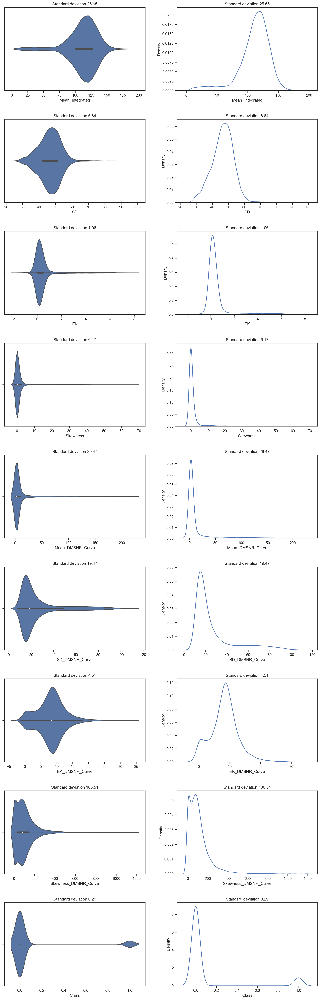

In [28]:
fig, ax = plt.subplots(nrows = len(Pulsar.columns), ncols = 2, figsize = (14,42))
cols = Pulsar.columns
cols

for col in range(len(Pulsar.columns)):
    sns.violinplot(x = Pulsar.iloc[:, col], ax = ax[col][0])
    ax[col][0].set(xlabel = Pulsar.columns[col], title = "Standard deviation {0}".format(round(Pulsar.iloc[:, col].std(), 2)))

    sns.kdeplot(data = Pulsar.iloc[:, col], ax = ax[col][1])
    ax[col][1].set(xlabel = Pulsar.columns[col], title = "Standard deviation {0}".format(round(Pulsar.iloc[:, col].std(), 2)))

plt.tight_layout(pad = 3)

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, '111.07996834492681')

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, '46.54953156153424')

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, '0.47785725810191076')

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, '1.7702789980713487')

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, '12.614399658311543')

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, '26.326514703918594')

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, '8.303556116638282')

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, '104.85770870366203')

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, '0.09157447759526204')

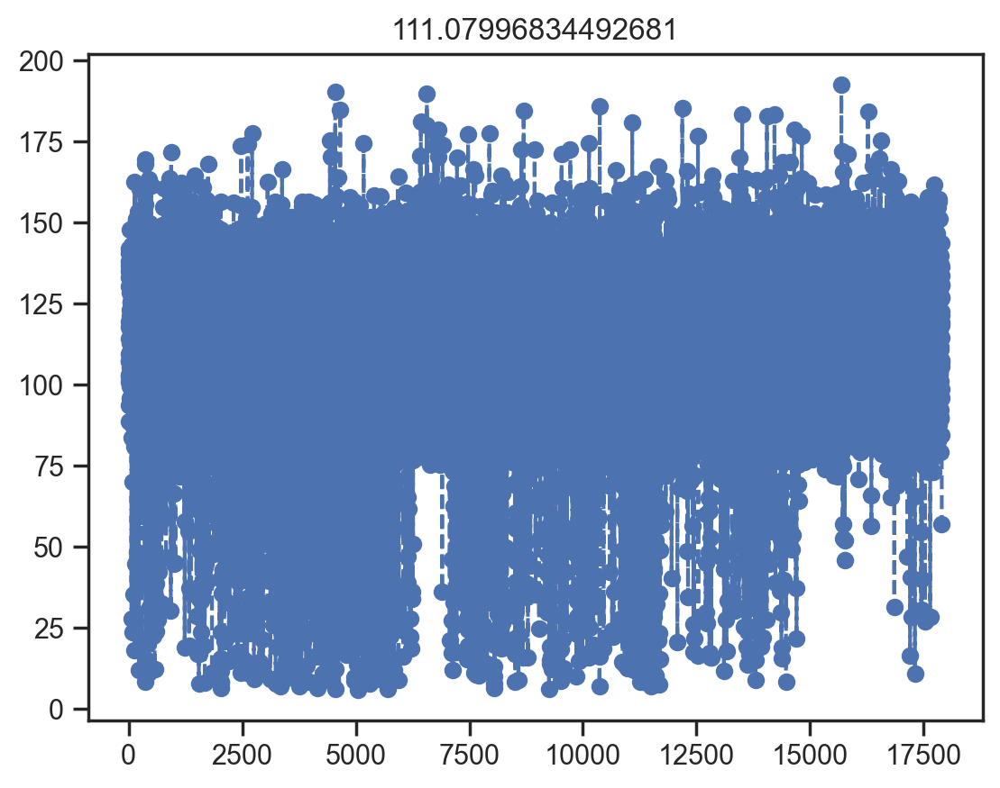

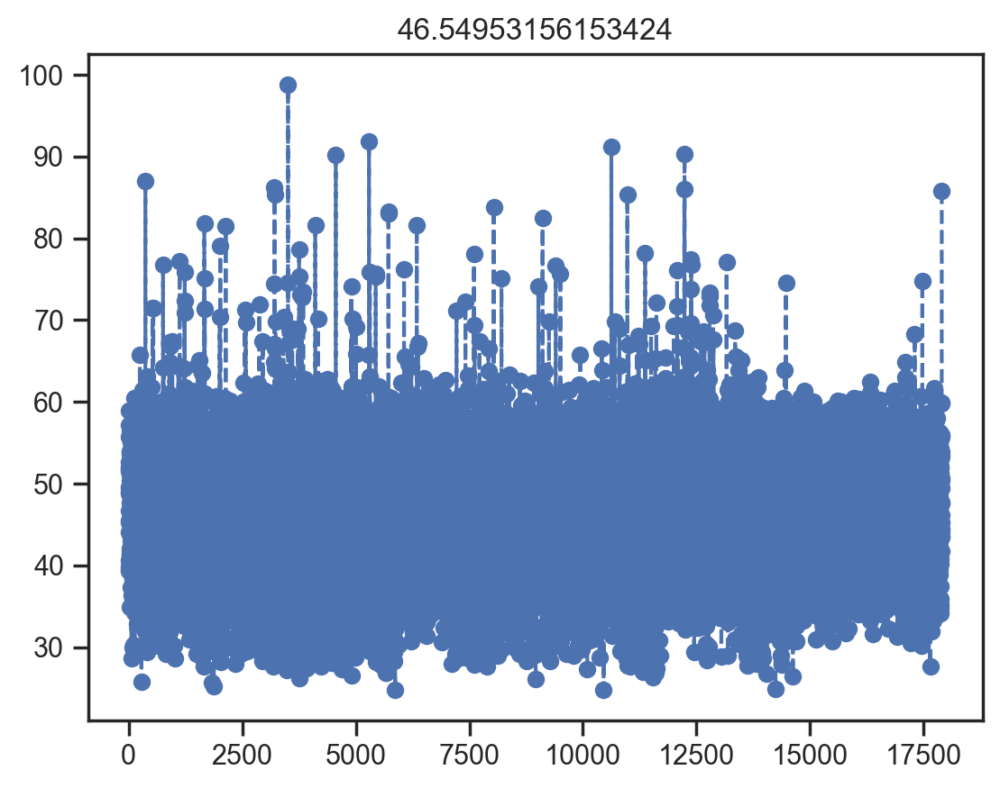

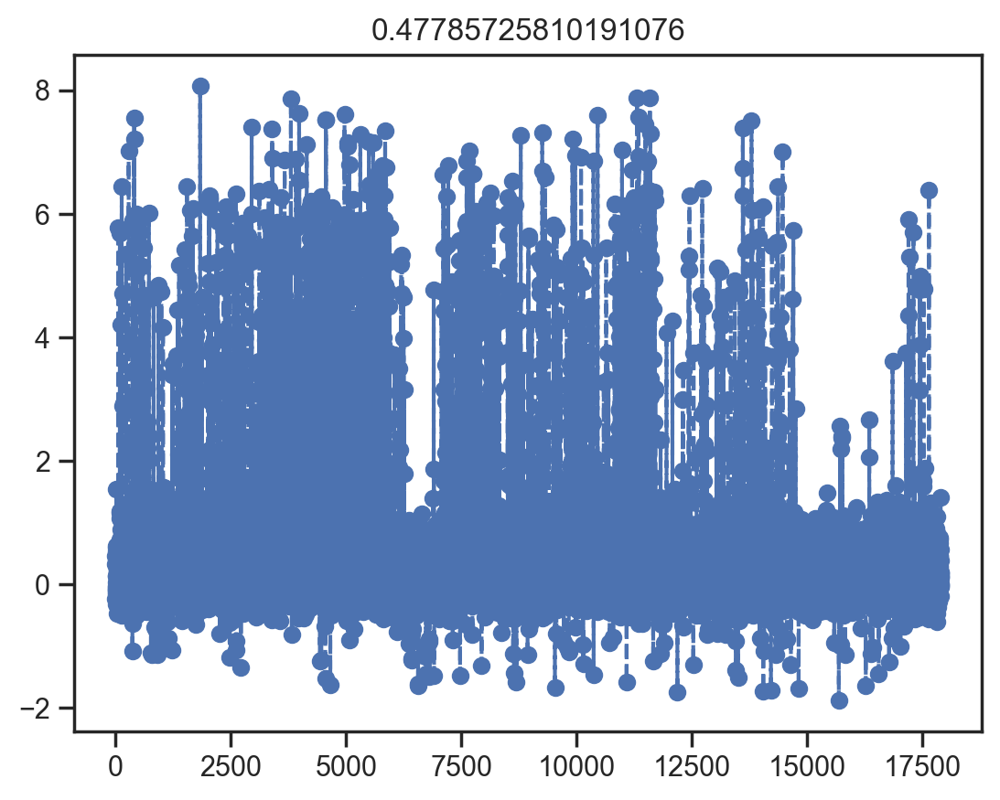

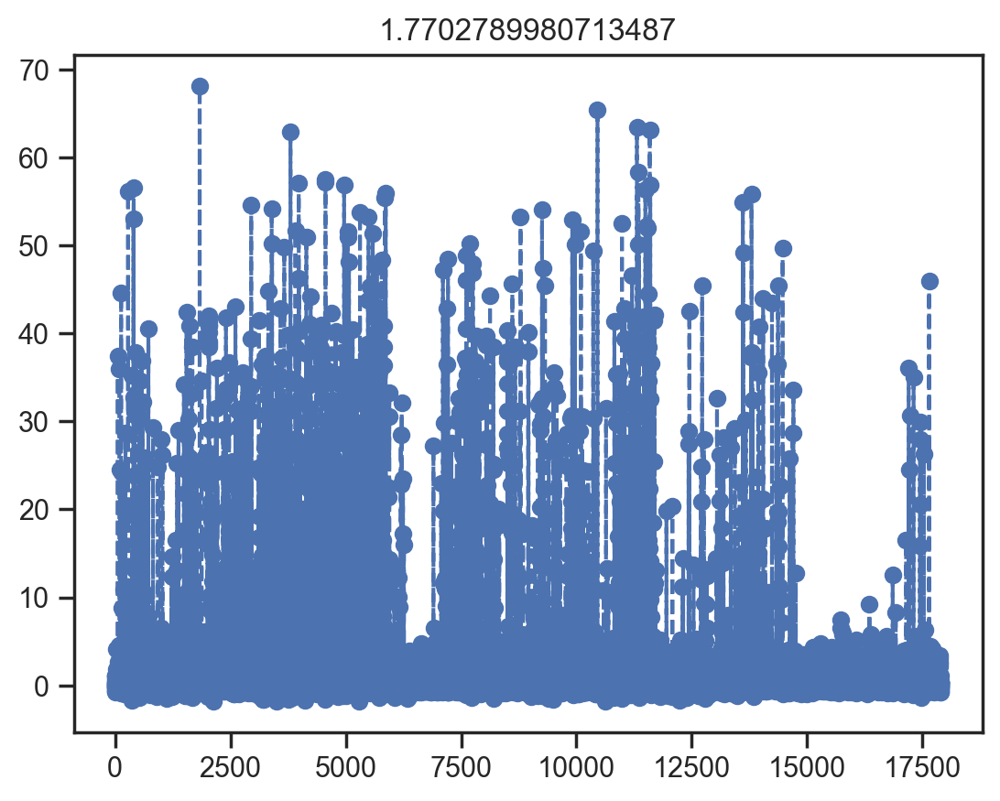

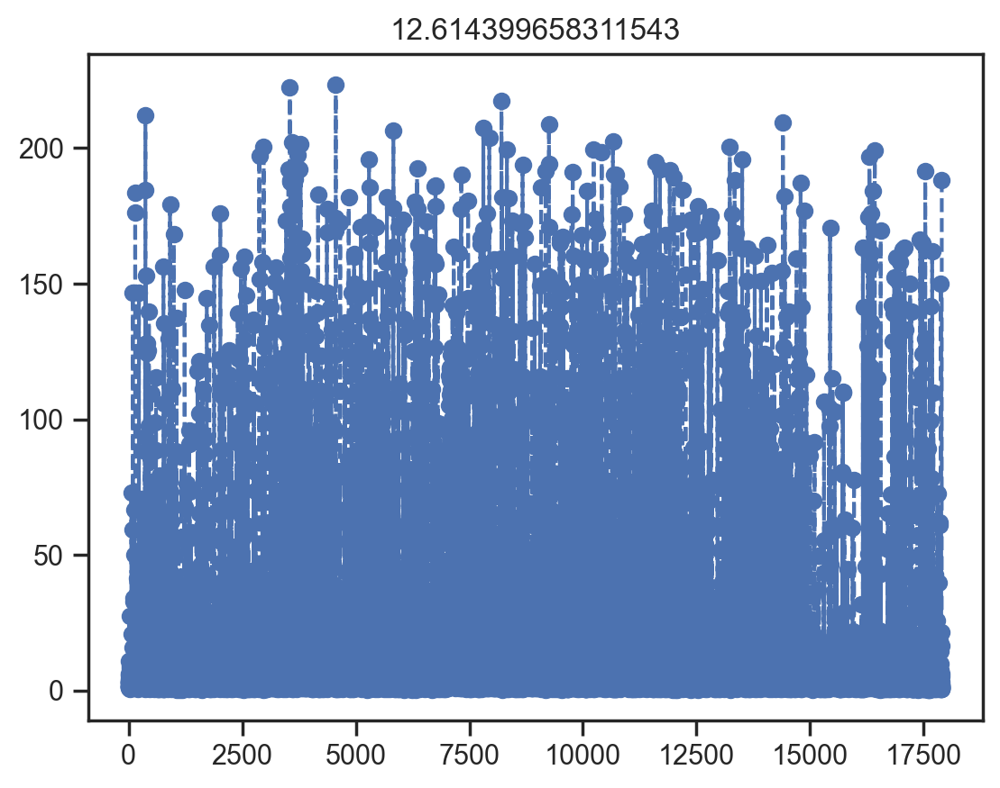

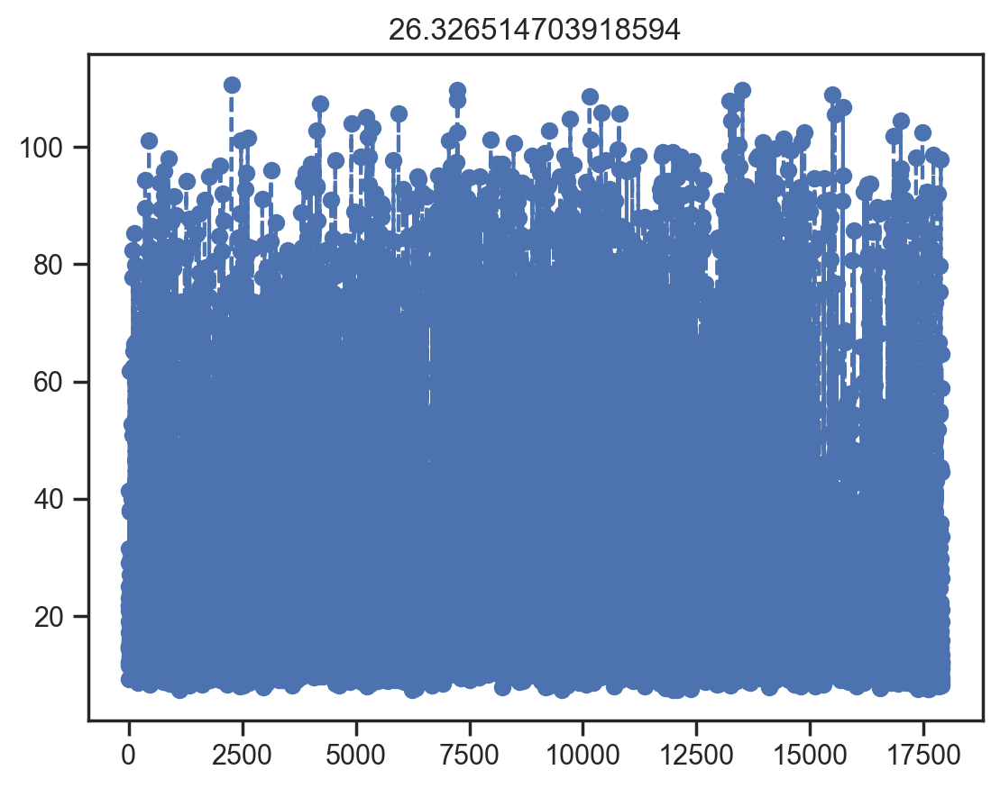

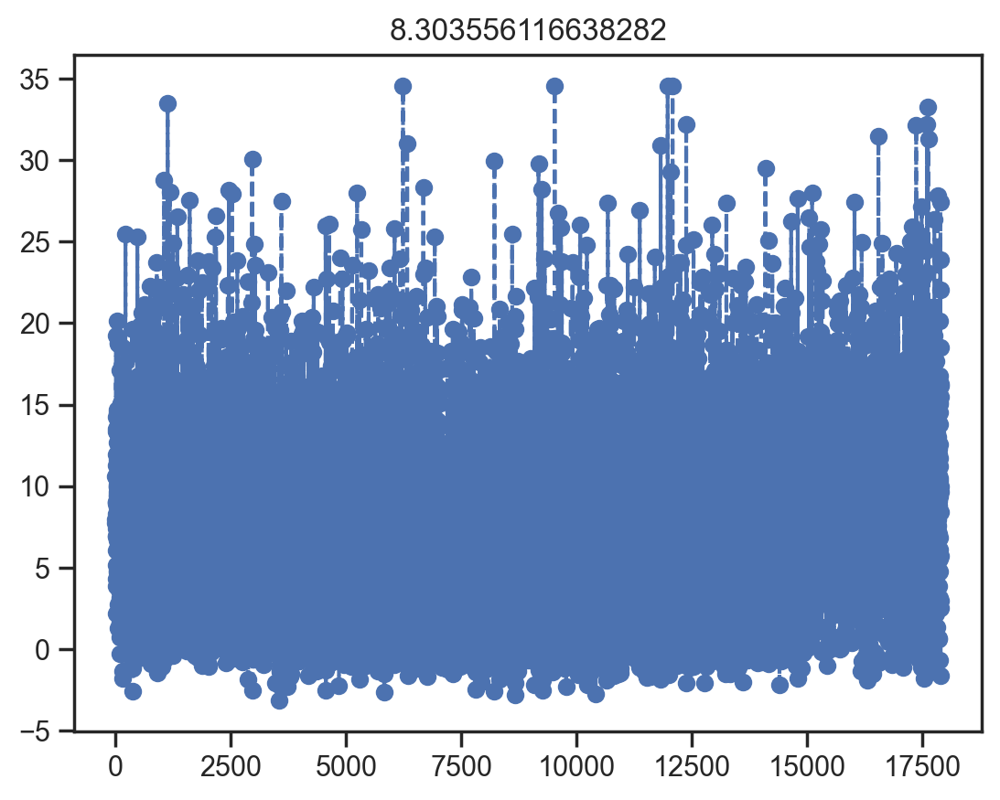

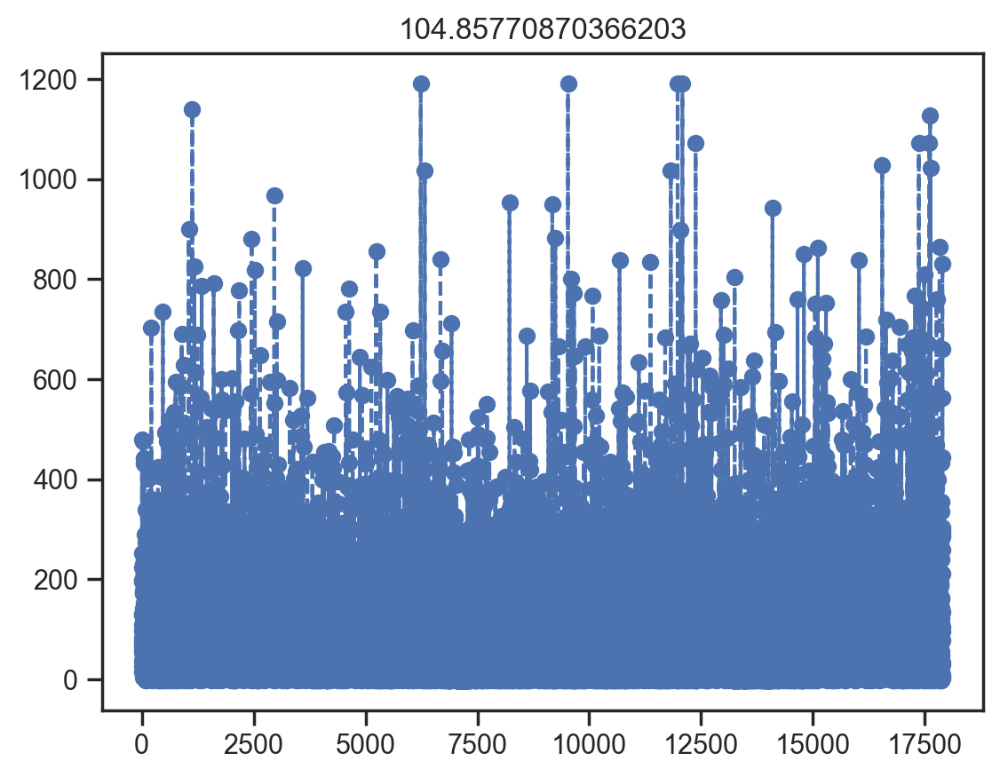

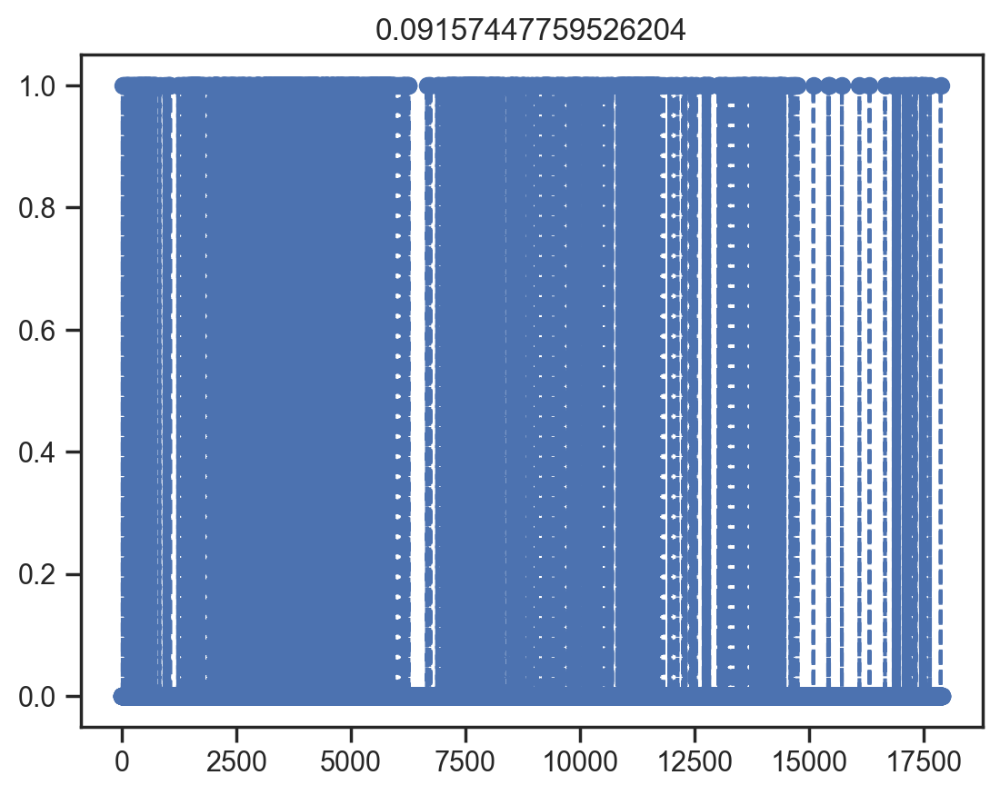

In [29]:
for i in Pulsar.columns:
    plt.figure()
    plt.plot(Pulsar[i],'--o')
    plt.title(Pulsar[i].mean())

Index(['Mean_Integrated', 'SD', 'EK', 'Skewness', 'Mean_DMSNR_Curve',
       'SD_DMSNR_Curve', 'EK_DMSNR_Curve', 'Skewness_DMSNR_Curve', 'Class'],
      dtype='object')

<Axes: xlabel='Mean_Integrated', ylabel='Count'>

[Text(0.5, 0, 'Mean_Integrated')]

<Axes: >

[Text(0.5, 0, 'Mean_Integrated')]

<Axes: xlabel='SD', ylabel='Count'>

[Text(0.5, 0, 'SD')]

<Axes: >

[Text(0.5, 0, 'SD')]

<Axes: xlabel='EK', ylabel='Count'>

[Text(0.5, 0, 'EK')]

<Axes: >

[Text(0.5, 0, 'EK')]

<Axes: xlabel='Skewness', ylabel='Count'>

[Text(0.5, 0, 'Skewness')]

<Axes: >

[Text(0.5, 0, 'Skewness')]

<Axes: xlabel='Mean_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'Mean_DMSNR_Curve')]

<Axes: >

[Text(0.5, 0, 'Mean_DMSNR_Curve')]

<Axes: xlabel='SD_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'SD_DMSNR_Curve')]

<Axes: >

[Text(0.5, 0, 'SD_DMSNR_Curve')]

<Axes: xlabel='EK_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'EK_DMSNR_Curve')]

<Axes: >

[Text(0.5, 0, 'EK_DMSNR_Curve')]

<Axes: xlabel='Skewness_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'Skewness_DMSNR_Curve')]

<Axes: >

[Text(0.5, 0, 'Skewness_DMSNR_Curve')]

<Axes: xlabel='Class', ylabel='Count'>

[Text(0.5, 0, 'Class')]

<Axes: >

[Text(0.5, 0, 'Class')]

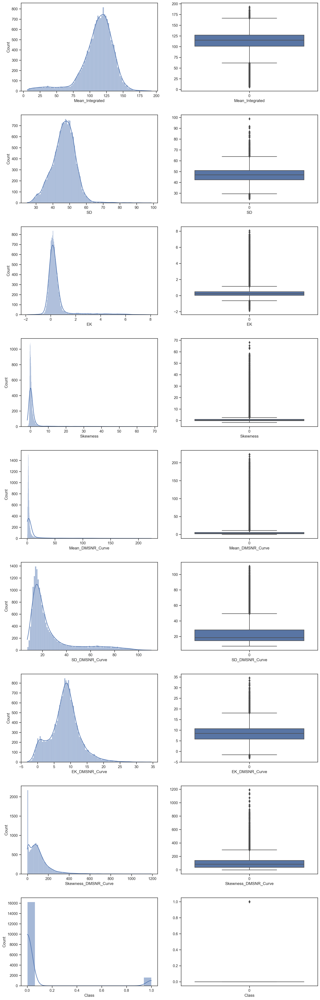

In [30]:
fig, ax = plt.subplots(nrows = len(Pulsar.columns), ncols = 2, figsize = (14,42))
cols = Pulsar.columns
cols
for col in range(len(Pulsar.columns)):
    sns.histplot(data = Pulsar.iloc[:, col], kde = True, ax = ax[col][0])
    ax[col][0].set(xlabel = Pulsar.columns[col])

    sns.boxplot(data = Pulsar.iloc[:, col], ax = ax[col][1])
    ax[col][1].set(xlabel = Pulsar.columns[col])
plt.tight_layout(pad = 3)

<Axes: xlabel='Mean_Integrated', ylabel='Count'>

[Text(0.5, 0, 'Mean_Integrated')]

<Axes: ylabel='Mean_Integrated'>

[Text(0.5, 0, 'Mean_Integrated')]

<Axes: xlabel='SD', ylabel='Count'>

[Text(0.5, 0, 'SD')]

<Axes: ylabel='SD'>

[Text(0.5, 0, 'SD')]

<Axes: xlabel='EK', ylabel='Count'>

[Text(0.5, 0, 'EK')]

<Axes: ylabel='EK'>

[Text(0.5, 0, 'EK')]

<Axes: xlabel='Skewness', ylabel='Count'>

[Text(0.5, 0, 'Skewness')]

<Axes: ylabel='Skewness'>

[Text(0.5, 0, 'Skewness')]

<Axes: xlabel='Mean_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'Mean_DMSNR_Curve')]

<Axes: ylabel='Mean_DMSNR_Curve'>

[Text(0.5, 0, 'Mean_DMSNR_Curve')]

<Axes: xlabel='SD_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'SD_DMSNR_Curve')]

<Axes: ylabel='SD_DMSNR_Curve'>

[Text(0.5, 0, 'SD_DMSNR_Curve')]

<Axes: xlabel='EK_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'EK_DMSNR_Curve')]

<Axes: ylabel='EK_DMSNR_Curve'>

[Text(0.5, 0, 'EK_DMSNR_Curve')]

<Axes: xlabel='Skewness_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'Skewness_DMSNR_Curve')]

<Axes: ylabel='Skewness_DMSNR_Curve'>

[Text(0.5, 0, 'Skewness_DMSNR_Curve')]

<Axes: xlabel='Class', ylabel='Count'>

[Text(0.5, 0, 'Class')]

<Axes: ylabel='Class'>

[Text(0.5, 0, 'Class')]

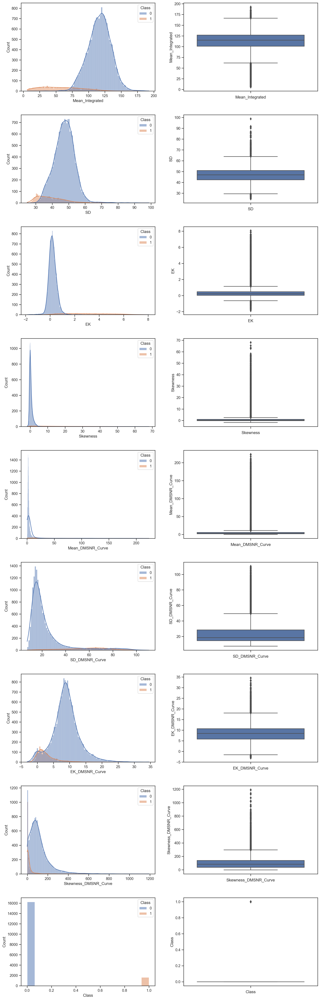

In [31]:
fig, ax = plt.subplots(nrows = len(Pulsar.columns), ncols = 2, figsize = (14,42))
cols = Pulsar.columns

for row in range(len(Pulsar.columns)):
    sns.histplot(data = Pulsar, x = Pulsar.iloc[:, row], kde = True, ax = ax[row][0], hue = 'Class')
    ax[row][0].set(xlabel = Pulsar.columns[row])

    sns.boxplot(data = Pulsar, y = Pulsar.iloc[:, row], ax = ax[row][1], hue = 'Class')
    ax[row][1].set(xlabel = Pulsar.columns[row])

plt.tight_layout(pad = 3)

In [32]:
for i in Pulsar.columns:
    print("Column -->", i,"\n")
    print("NaN values: ", Pulsar[i].isnull().sum())
    print("Duplicate values: ", Pulsar[i].duplicated().sum())
    print("Frequency: ", Pulsar[i].value_counts())
    print("\n\n")

Column --> Mean_Integrated 

NaN values:  0
Duplicate values:  9272
Frequency:  Mean_Integrated
106.710938    12
112.914062     9
106.648438     9
124.546875     9
115.234375     8
              ..
96.726562      1
98.687500      1
92.429688      1
37.671875      1
57.062500      1
Name: count, Length: 8626, dtype: int64



Column --> SD 

NaN values:  0
Duplicate values:  36
Frequency:  SD
46.843823    2
43.404709    2
46.521962    2
51.042749    2
40.515188    2
            ..
43.489755    1
40.045796    1
50.672113    1
35.093895    1
85.797340    1
Name: count, Length: 17862, dtype: int64



Column --> EK 

NaN values:  0
Duplicate values:  1
Frequency:  EK
 0.001934    2
-0.234571    1
 0.369225    1
 0.138200    1
 0.096402    1
            ..
 0.077943    1
 0.200566    1
 0.141588    1
 0.025969    1
 1.406391    1
Name: count, Length: 17897, dtype: int64



Column --> Skewness 

NaN values:  0
Duplicate values:  0
Frequency:  Skewness
-0.699648    1
 0.377323    1
-0.681335   

In [33]:
corrPearson = data.corr(method="pearson")

In [34]:
corrSpearman = data.corr(method="spearman")

<Axes: >

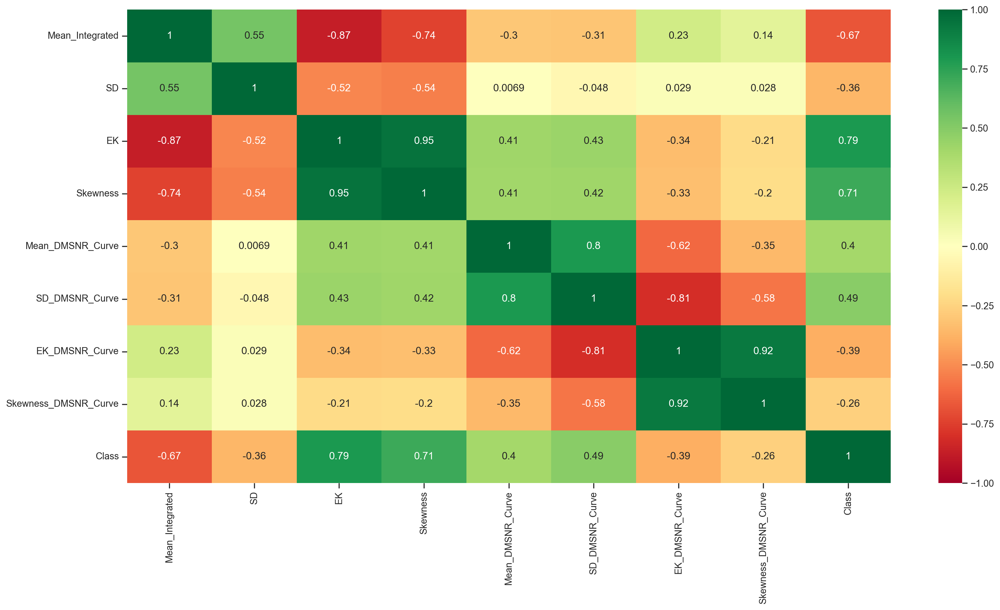

In [35]:
figure = plt.figure(figsize=(20,10))
sns.heatmap(corrPearson,annot=True,cmap="RdYlGn",vmin=-1,vmax=1,center=0,linecolor="black")
plt.show()

<Axes: >

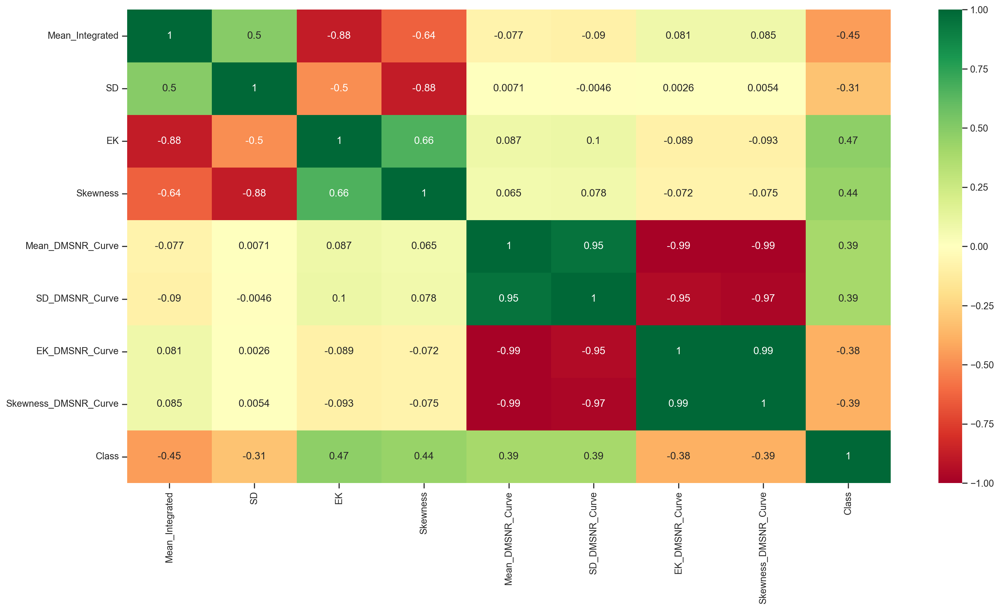

In [36]:
figure = plt.figure(figsize=(20,10))
sns.heatmap(corrSpearman,annot=True,cmap="RdYlGn",vmin=-1,vmax=1,center=0,linecolor="black")
plt.show()

In [37]:
for i in data.columns:
    print("----"*30)
    print(i)
    print("%.3f - %.3f" % shapiro(data[i]))

------------------------------------------------------------------------------------------------------------------------
Mean_Integrated
0.903 - 0.000
------------------------------------------------------------------------------------------------------------------------
SD
0.982 - 0.000
------------------------------------------------------------------------------------------------------------------------
EK
0.553 - 0.000
------------------------------------------------------------------------------------------------------------------------
Skewness
0.352 - 0.000
------------------------------------------------------------------------------------------------------------------------
Mean_DMSNR_Curve
0.421 - 0.000
------------------------------------------------------------------------------------------------------------------------
SD_DMSNR_Curve
0.729 - 0.000
------------------------------------------------------------------------------------------------------------------------
EK_DMS

In [38]:
print("%.3f - %.3f" % levene(data["Mean_Integrated"],data["SD"],data["EK"],
                            data["Skewness"],data["Mean_DMSNR_Curve"],data["SD_DMSNR_Curve"],
                            data["EK_DMSNR_Curve"],data["Skewness_DMSNR_Curve"]))

8700.446 - 0.000


array([[<Axes: title={'center': 'Mean_Integrated'}>,
        <Axes: title={'center': 'SD'}>, <Axes: title={'center': 'EK'}>],
       [<Axes: title={'center': 'Skewness'}>,
        <Axes: title={'center': 'Mean_DMSNR_Curve'}>,
        <Axes: title={'center': 'SD_DMSNR_Curve'}>],
       [<Axes: title={'center': 'EK_DMSNR_Curve'}>,
        <Axes: title={'center': 'Skewness_DMSNR_Curve'}>,
        <Axes: title={'center': 'Class'}>]], dtype=object)

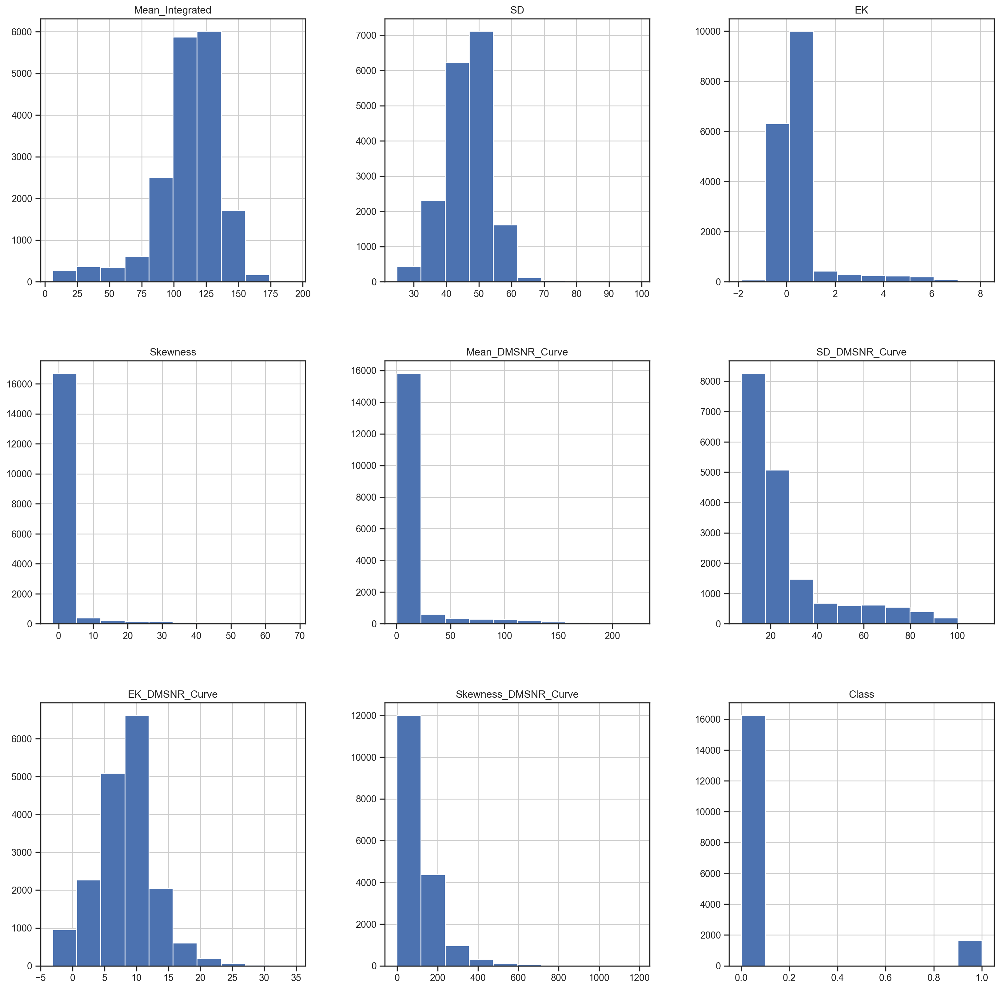

In [39]:
data.hist(figsize=(20,20))
plt.show()

<Axes: xlabel='Mean_Integrated', ylabel='Class'>

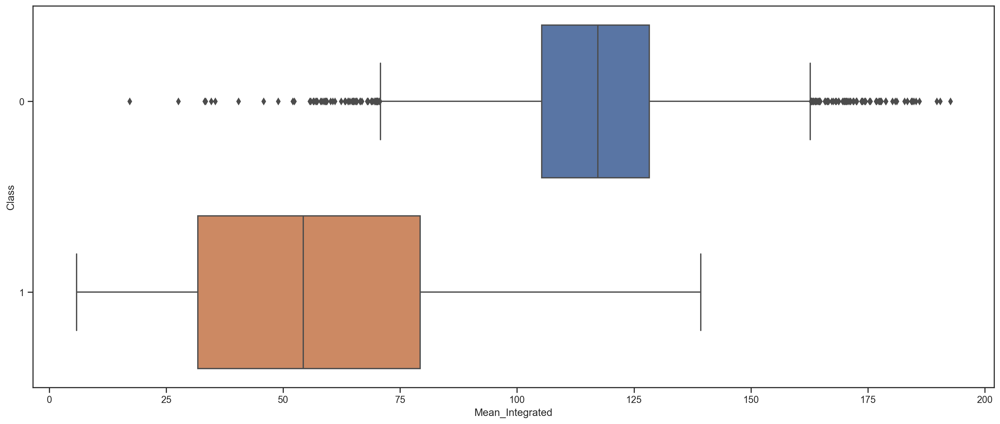

In [40]:
figure = plt.figure(figsize=(20,8))
sns.boxplot(x="Mean_Integrated",y="Class",data=dataV)
plt.show()

<Axes: xlabel='SD', ylabel='Class'>

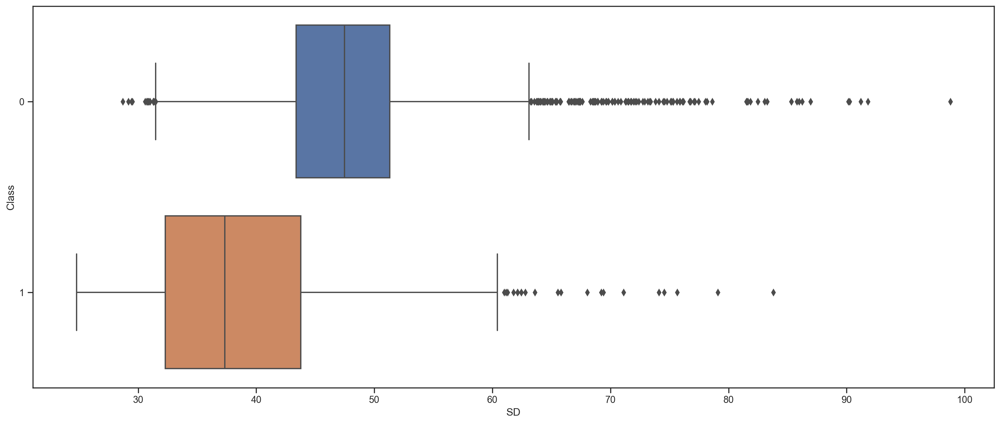

In [41]:
figure = plt.figure(figsize=(20,8))
sns.boxplot(x="SD",y="Class",data=dataV)
plt.show()

<Axes: xlabel='EK', ylabel='Class'>

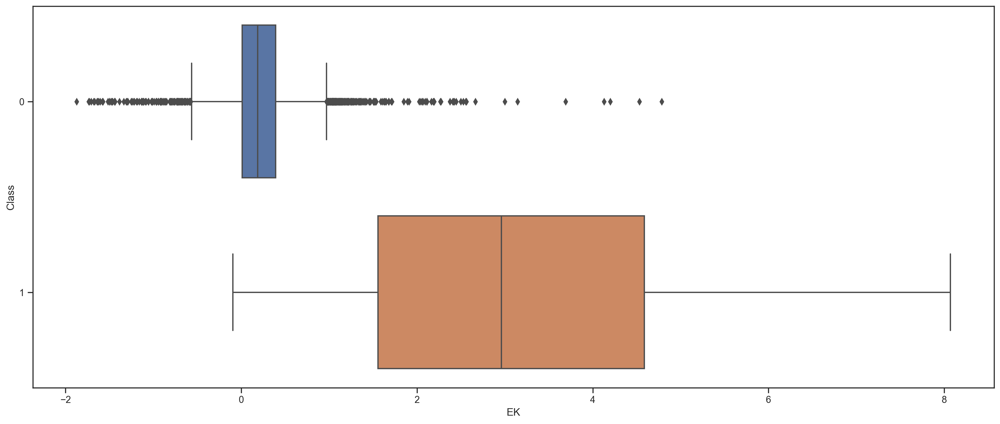

In [42]:
figure = plt.figure(figsize=(20,8))
sns.boxplot(x="EK",y="Class",data=dataV)
plt.show()

<Axes: xlabel='Skewness', ylabel='Class'>

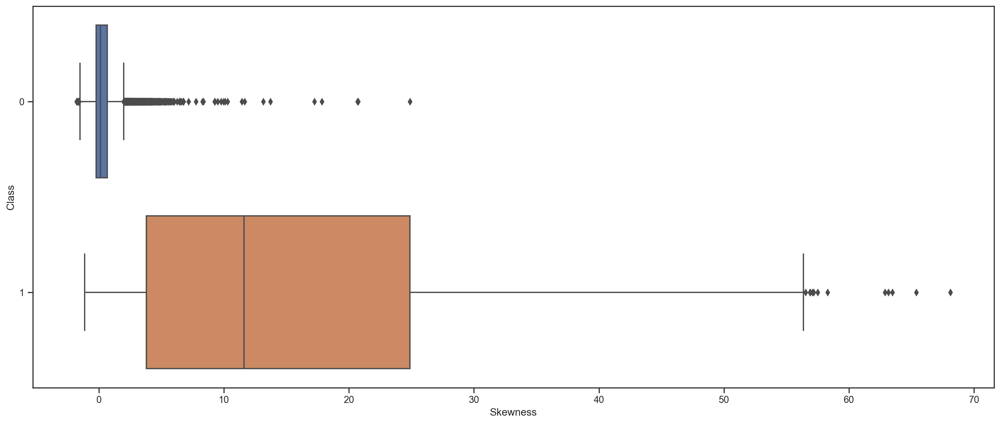

In [43]:
figure = plt.figure(figsize=(20,8))
sns.boxplot(x="Skewness",y="Class",data=dataV)
plt.show()

<Axes: xlabel='Mean_DMSNR_Curve', ylabel='Class'>

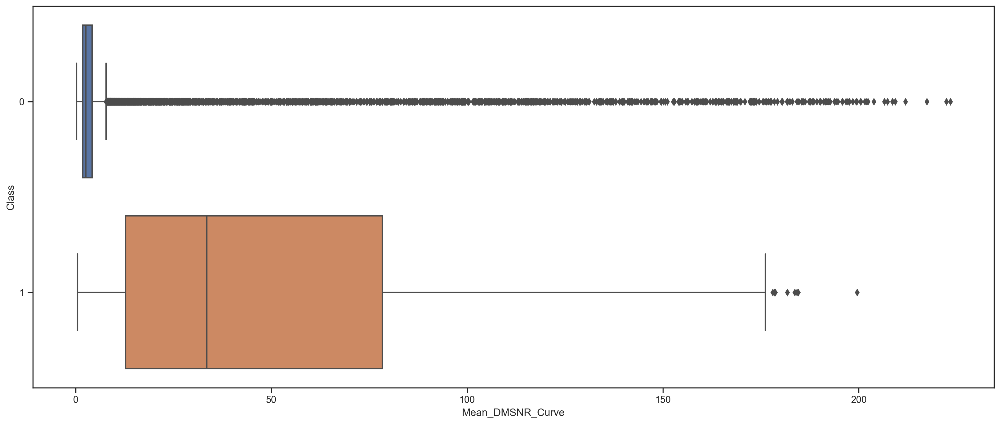

In [44]:
figure = plt.figure(figsize=(20,8))
sns.boxplot(x="Mean_DMSNR_Curve",y="Class",data=dataV)
plt.show()

<Axes: xlabel='SD_DMSNR_Curve', ylabel='Class'>

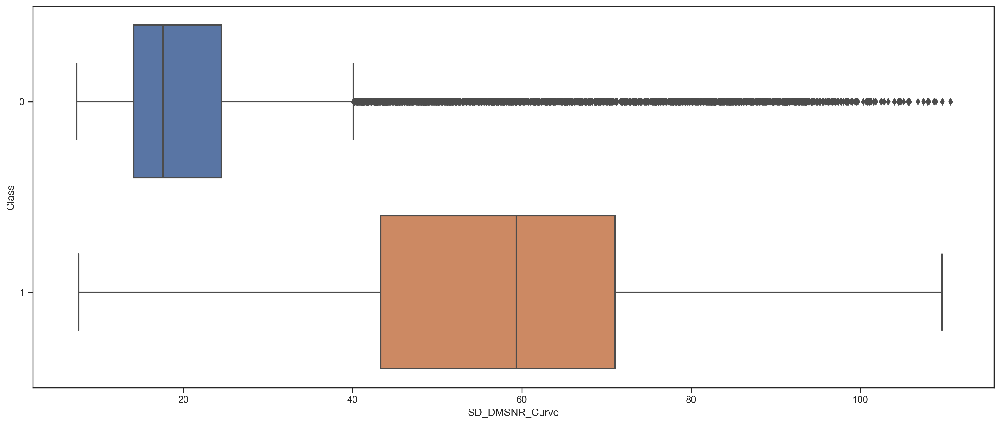

In [45]:
figure = plt.figure(figsize=(20,8))
sns.boxplot(x="SD_DMSNR_Curve",y="Class",data=dataV)
plt.show()

<Axes: xlabel='EK_DMSNR_Curve', ylabel='Class'>

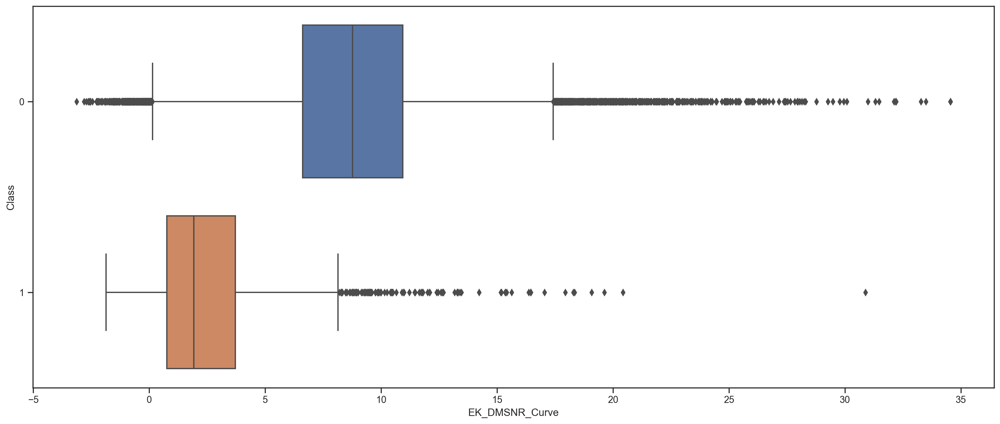

In [46]:
figure = plt.figure(figsize=(20,8))
sns.boxplot(x="EK_DMSNR_Curve",y="Class",data=dataV)
plt.show()

<Axes: xlabel='Skewness_DMSNR_Curve', ylabel='Class'>

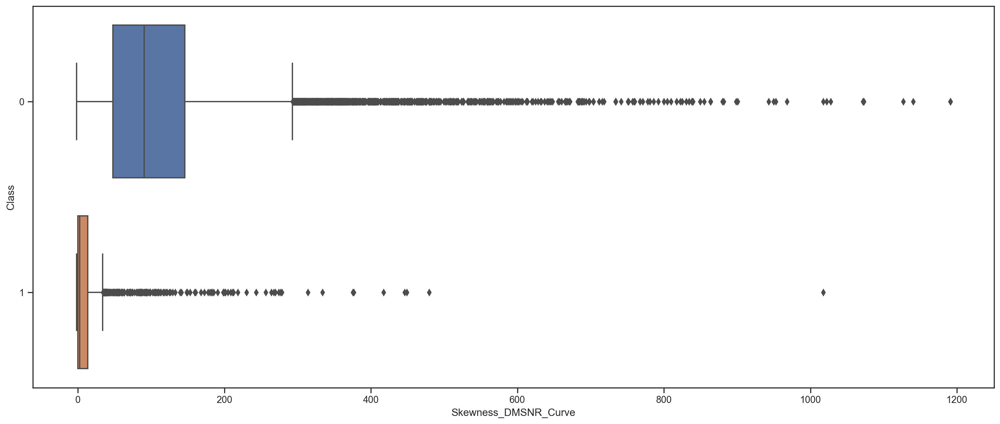

In [47]:
figure = plt.figure(figsize=(20,8))
sns.boxplot(x="Skewness_DMSNR_Curve",y="Class",data=dataV)
plt.show()

<Axes: xlabel='SD', ylabel='Mean_Integrated'>

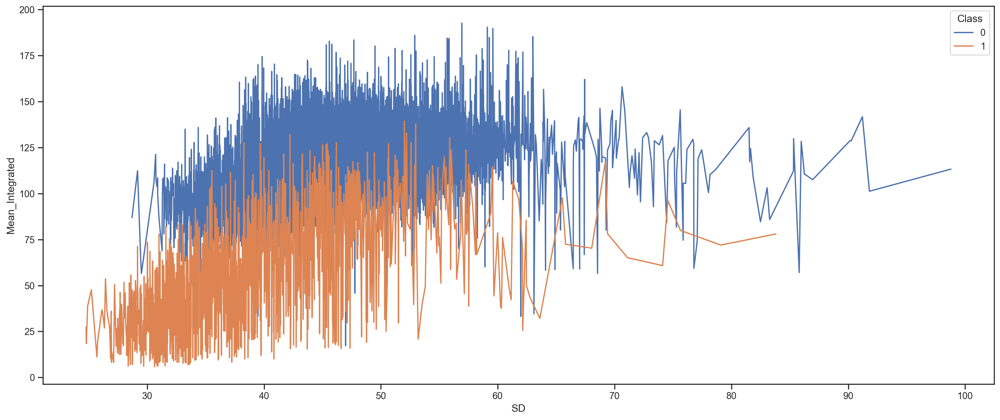

In [48]:
figure = plt.figure(figsize=(20,8))
sns.lineplot(x="SD",y="Mean_Integrated",hue="Class",data=dataV)
plt.show()

<Axes: xlabel='EK', ylabel='Mean_Integrated'>

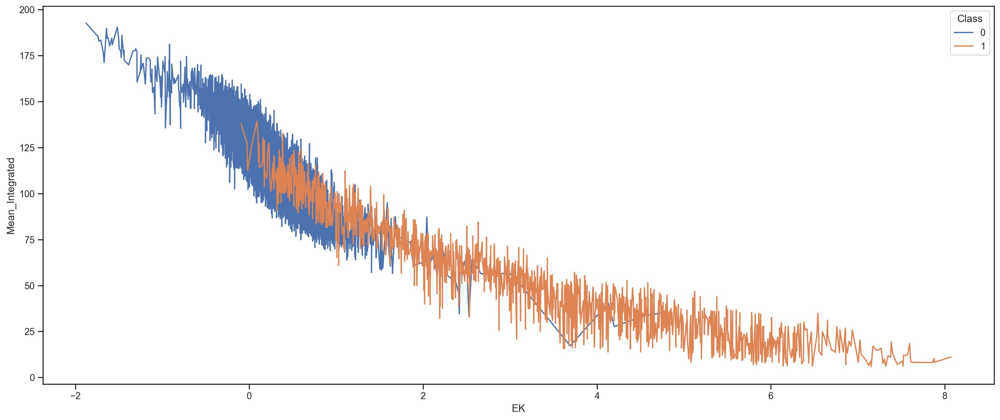

In [49]:
figure = plt.figure(figsize=(20,8))
sns.lineplot(x="EK",y="Mean_Integrated",hue="Class",data=dataV)
plt.show()

<Axes: xlabel='Skewness', ylabel='Mean_Integrated'>

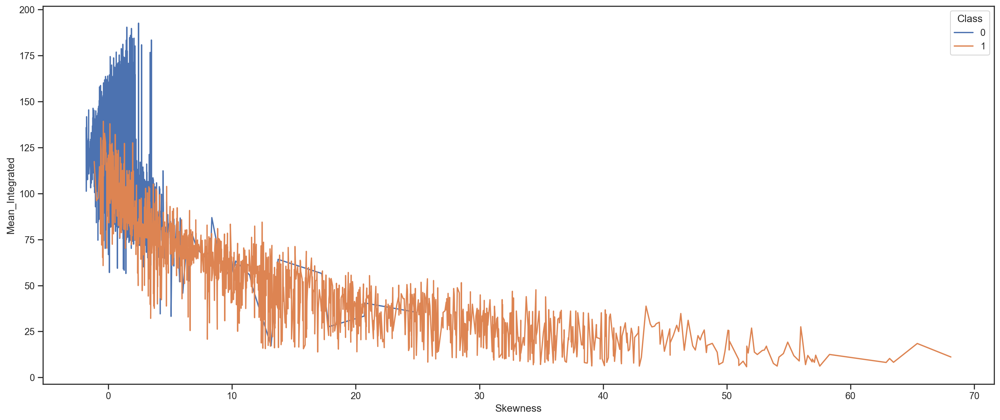

In [50]:
figure = plt.figure(figsize=(20,8))
sns.lineplot(x="Skewness",y="Mean_Integrated",hue="Class",data=dataV)
plt.show()

<Axes: xlabel='SD_DMSNR_Curve', ylabel='Mean_Integrated'>

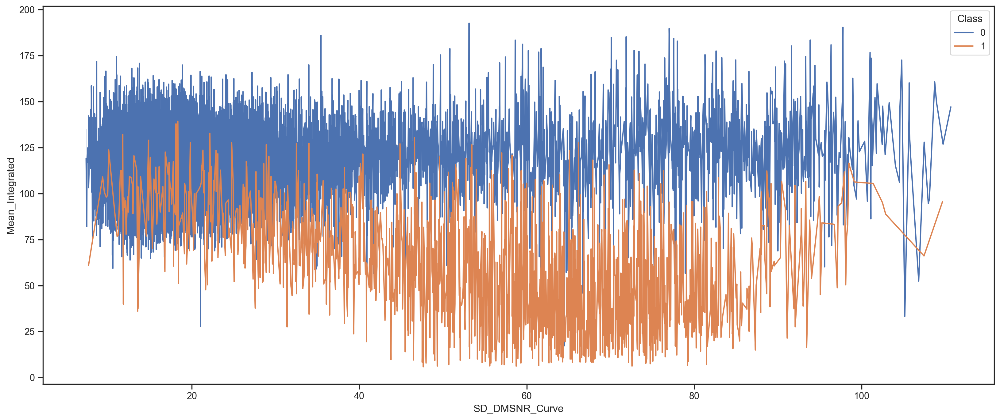

In [51]:
figure = plt.figure(figsize=(20,8))
sns.lineplot(x="SD_DMSNR_Curve",y="Mean_Integrated",hue="Class",data=dataV)
plt.show()

<Axes: xlabel='EK_DMSNR_Curve', ylabel='Mean_Integrated'>

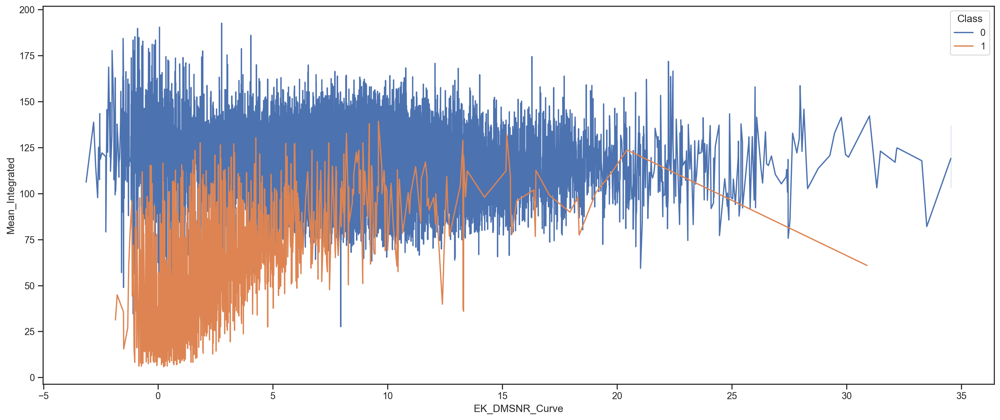

In [52]:
figure = plt.figure(figsize=(20,8))
sns.lineplot(x="EK_DMSNR_Curve",y="Mean_Integrated",hue="Class",data=dataV)
plt.show()

<Axes: xlabel='Skewness_DMSNR_Curve', ylabel='Mean_Integrated'>

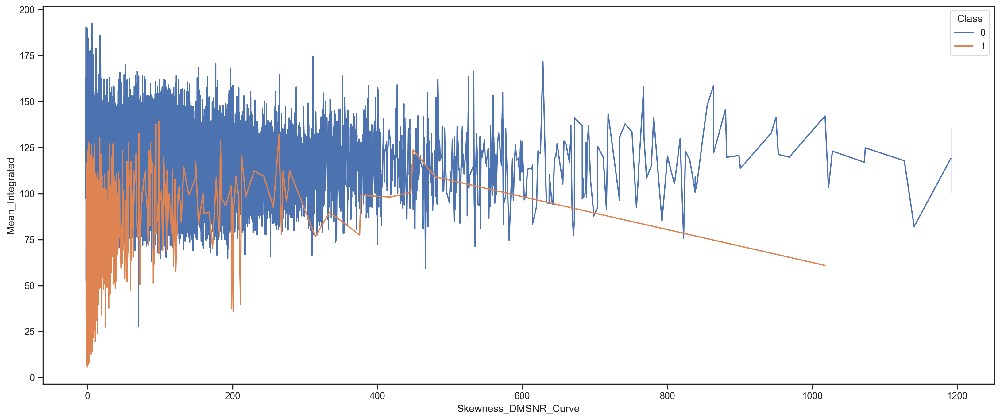

In [53]:
figure = plt.figure(figsize=(20,8))
sns.lineplot(x="Skewness_DMSNR_Curve",y="Mean_Integrated",hue="Class",data=dataV)
plt.show()

<Axes: xlabel='Mean_Integrated', ylabel='Count'>

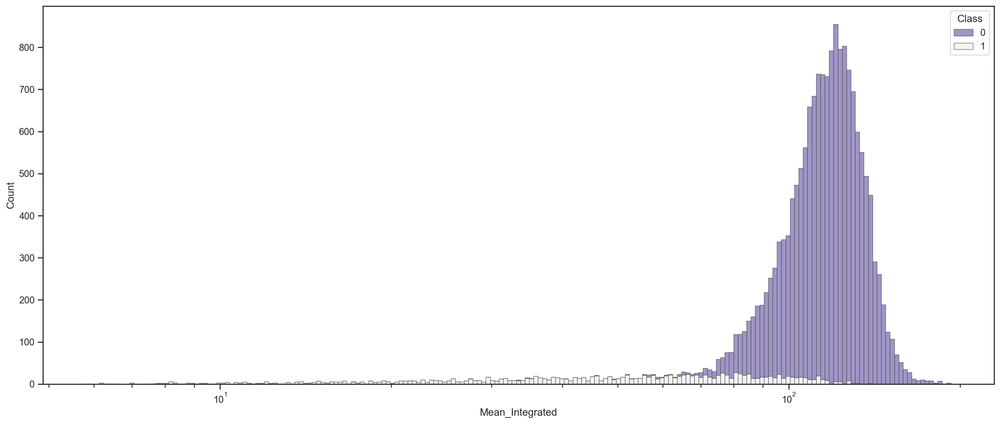

In [54]:
figure = plt.figure(figsize=(20,8))
sns.histplot(
    data,
    x="Mean_Integrated", hue="Class",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)

<Axes: xlabel='SD', ylabel='Count'>

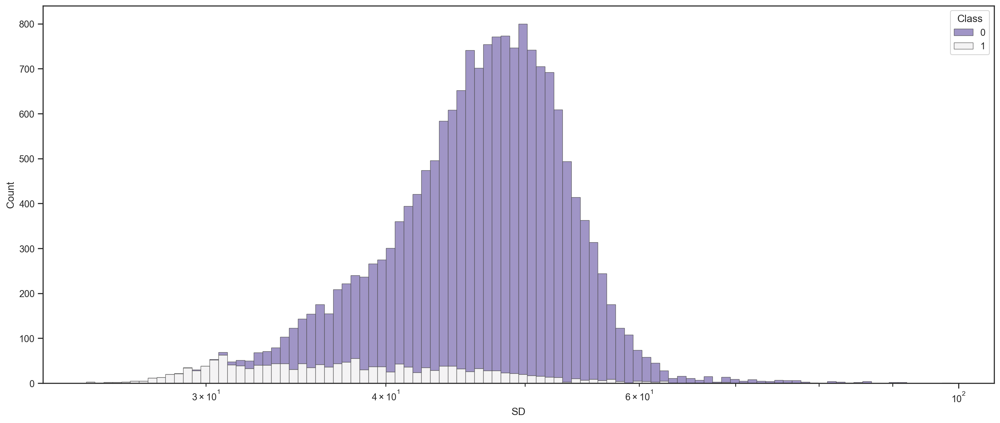

In [55]:
figure = plt.figure(figsize=(20,8))
sns.histplot(
    data,
    x="SD", hue="Class",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)

<Axes: xlabel='EK', ylabel='Count'>

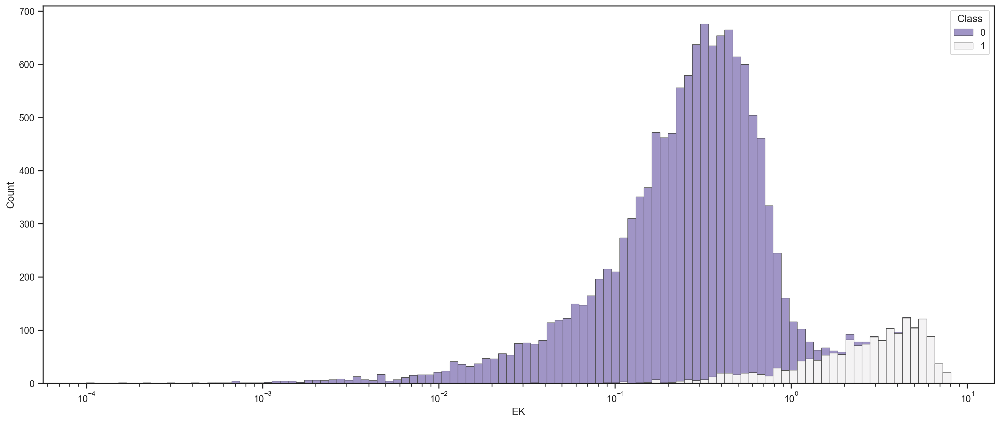

In [56]:
figure = plt.figure(figsize=(20,8))
sns.histplot(
    data,
    x="EK", hue="Class",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)

<Axes: xlabel='Skewness', ylabel='Count'>

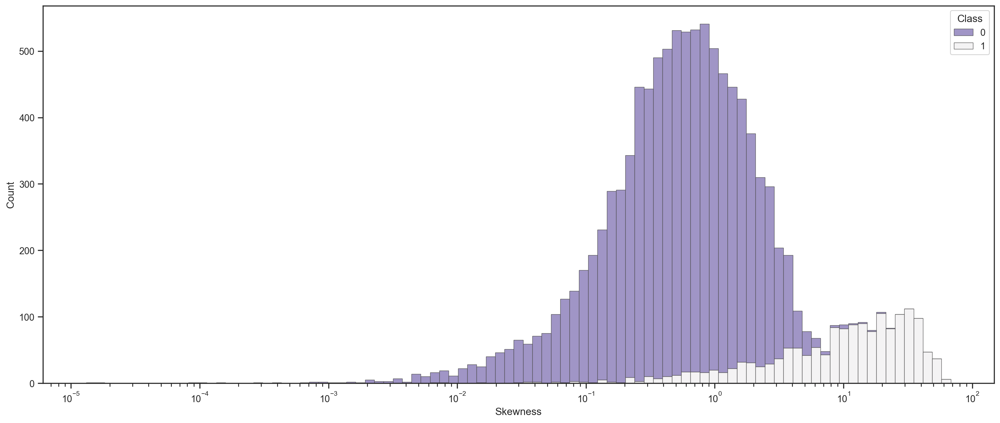

In [57]:
figure = plt.figure(figsize=(20,8))
sns.histplot(
    data,
    x="Skewness", hue="Class",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)

<Axes: xlabel='Mean_DMSNR_Curve', ylabel='Count'>

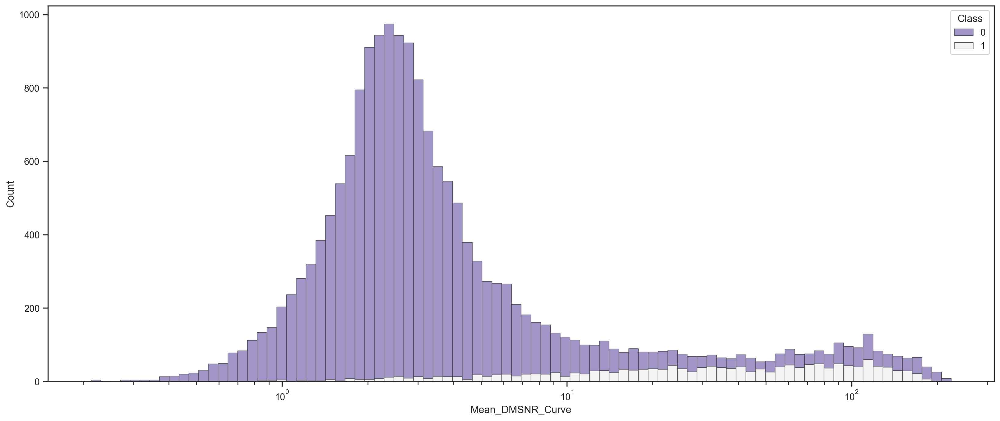

In [58]:
figure = plt.figure(figsize=(20,8))
sns.histplot(
    data,
    x="Mean_DMSNR_Curve", hue="Class",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)

<Axes: xlabel='SD_DMSNR_Curve', ylabel='Count'>

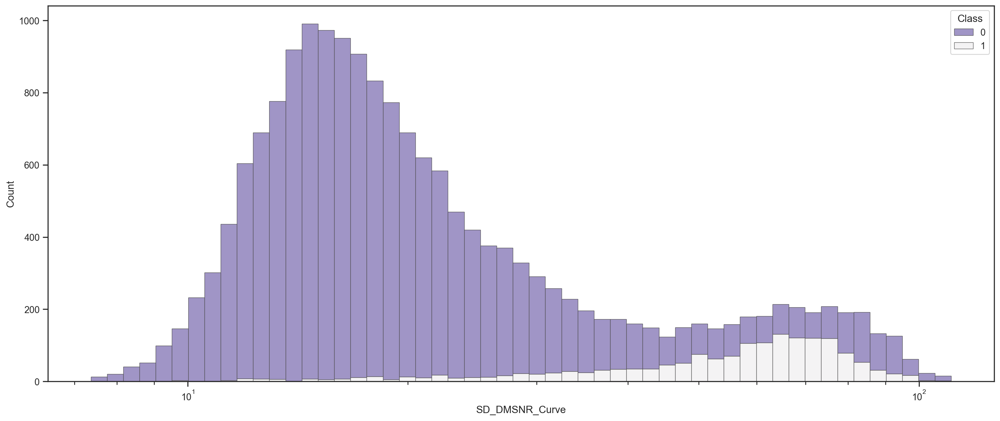

In [59]:
figure = plt.figure(figsize=(20,8))
sns.histplot(
    data,
    x="SD_DMSNR_Curve", hue="Class",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)

<Axes: xlabel='EK_DMSNR_Curve', ylabel='Count'>

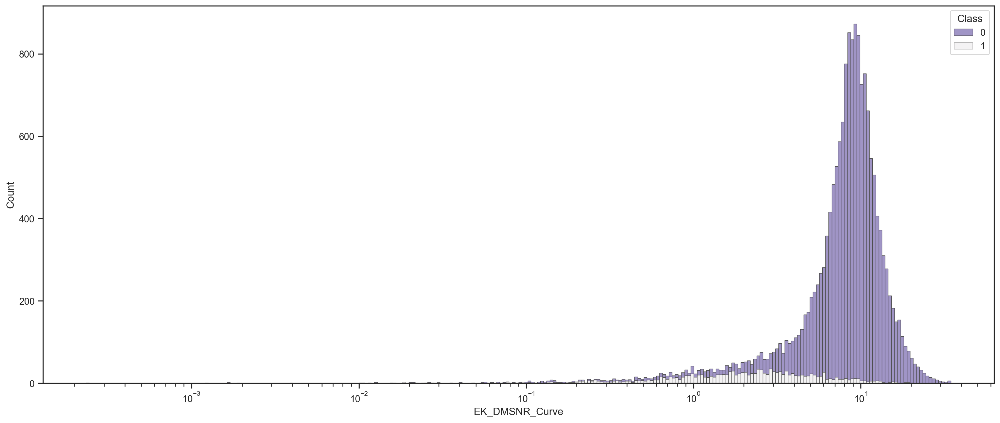

In [60]:
figure = plt.figure(figsize=(20,8))
sns.histplot(
    data,
    x="EK_DMSNR_Curve", hue="Class",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)

<Axes: xlabel='Skewness_DMSNR_Curve', ylabel='Count'>

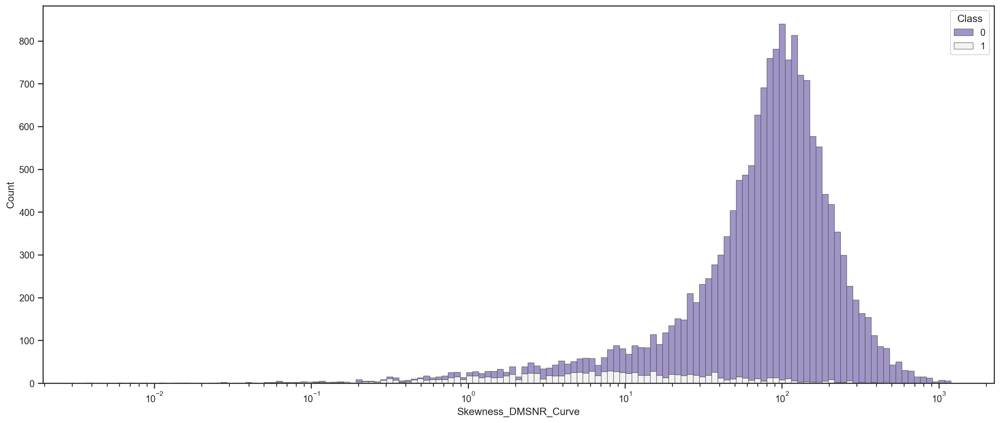

In [61]:
figure = plt.figure(figsize=(20,8))
sns.histplot(
    data,
    x="Skewness_DMSNR_Curve", hue="Class",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)

<Figure size 2000x800 with 0 Axes>

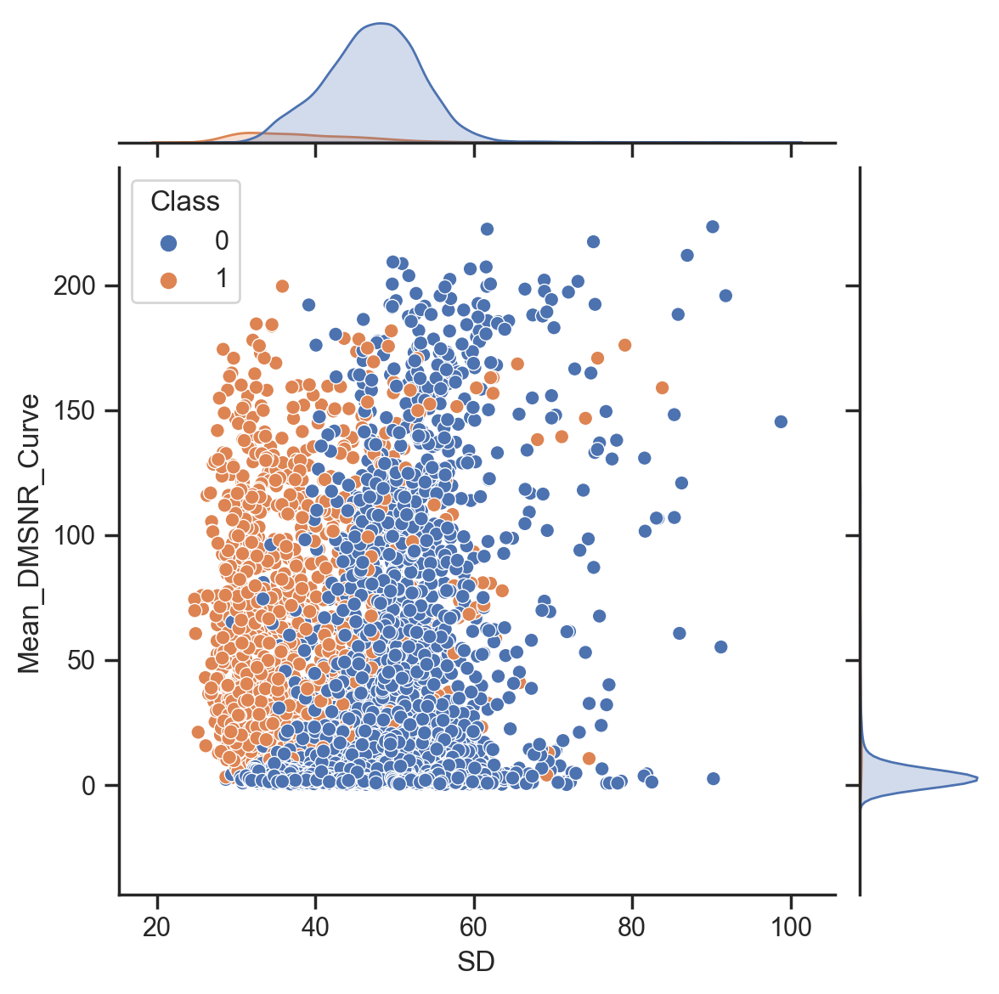

In [62]:
figure = plt.figure(figsize=(20,8))
sns.jointplot(x="SD",y="Mean_DMSNR_Curve", color="#4CB391",hue="Class",data=data)
plt.show()

<Figure size 2000x800 with 0 Axes>

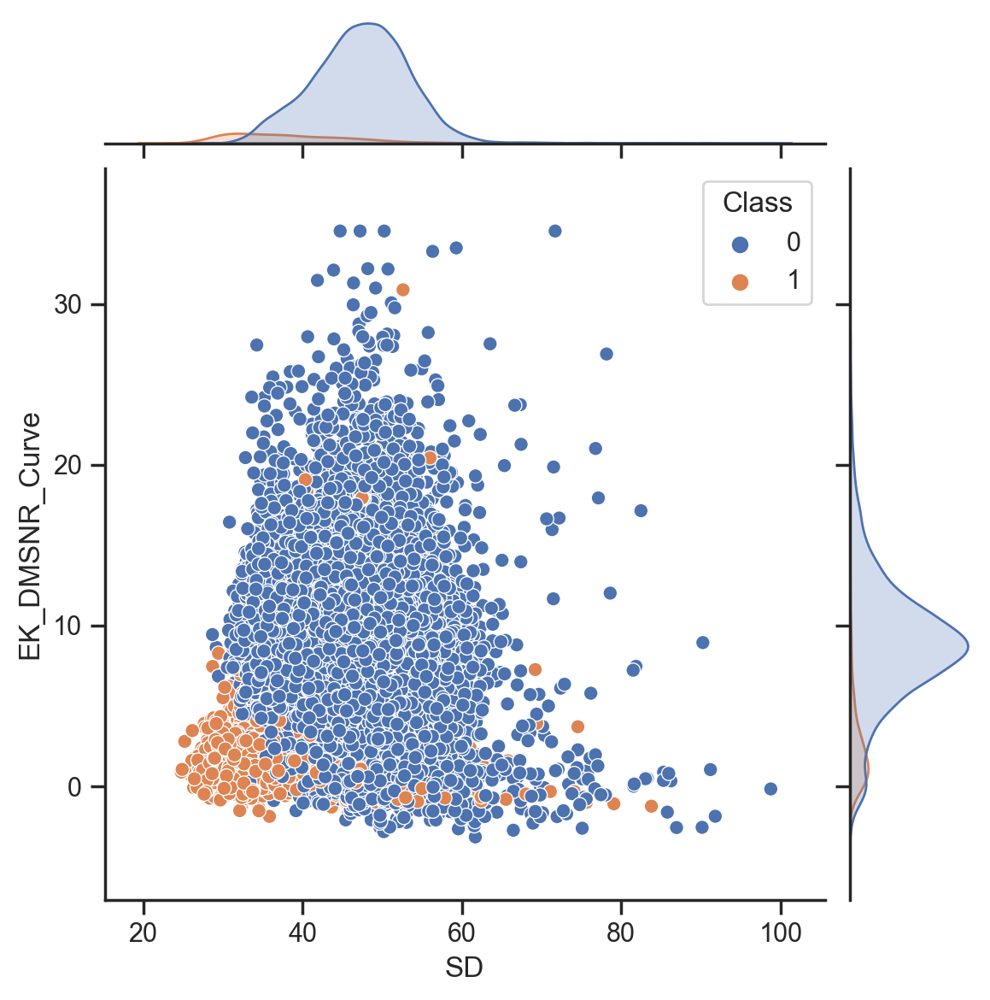

In [63]:
figure = plt.figure(figsize=(20,8))
sns.jointplot(x="SD",y="EK_DMSNR_Curve", color="#4CB391",hue="Class",data=data)
plt.show()

<Figure size 2000x800 with 0 Axes>

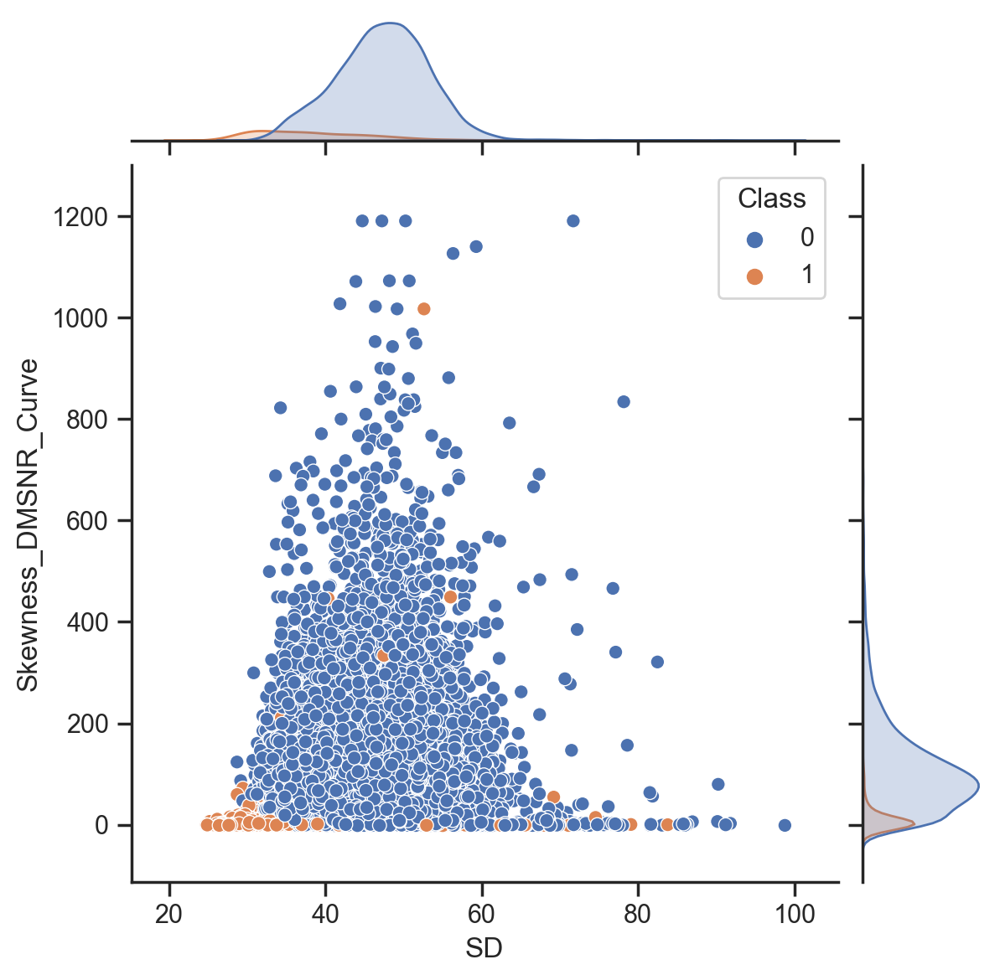

In [64]:
figure = plt.figure(figsize=(20,8))
sns.jointplot(x="SD",y="Skewness_DMSNR_Curve", color="#4CB391",hue="Class",data=data)
plt.show()

<Figure size 2000x800 with 0 Axes>

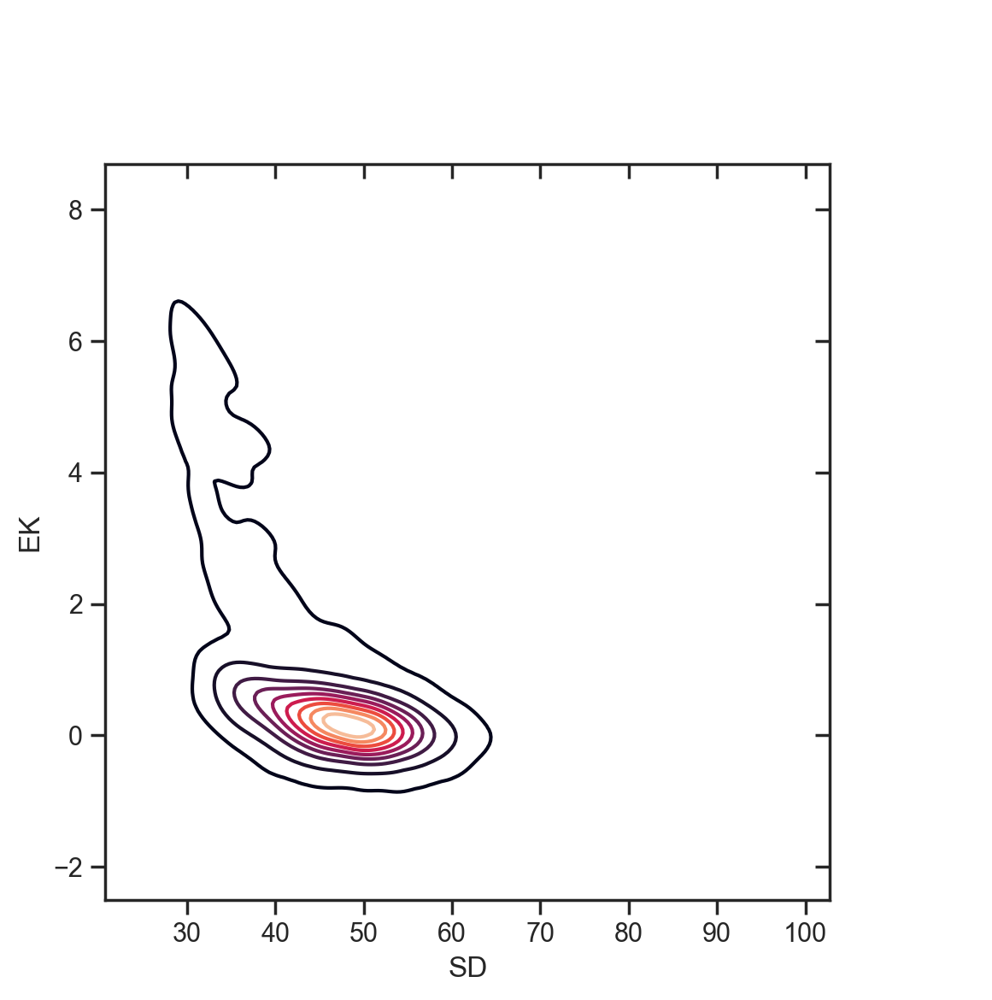

In [65]:
figure = plt.figure(figsize=(20,8))
g = sns.JointGrid(data=data, x="SD", y="EK", space=0)
g.plot_joint(sns.kdeplot,cmap="rocket")
plt.show()

<Figure size 2000x800 with 0 Axes>

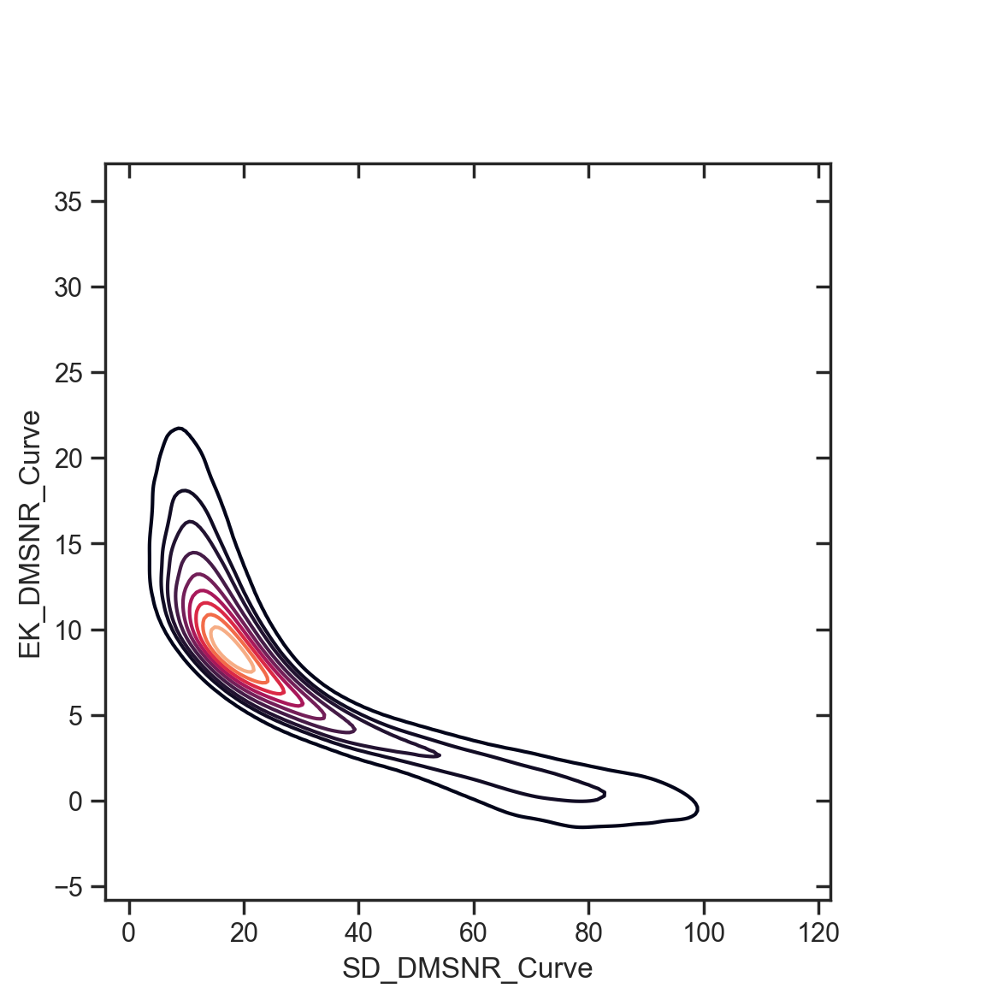

In [66]:
figure = plt.figure(figsize=(20,8))
g = sns.JointGrid(data=data, x="SD_DMSNR_Curve", y="EK_DMSNR_Curve", space=0)
g.plot_joint(sns.kdeplot,cmap="rocket")
plt.show()

In [67]:
fig = plt.figure(figsize=(20,10))
ax = Axes3D(fig)
ax.scatter(data["SD_DMSNR_Curve"], data["EK_DMSNR_Curve"], data["Skewness_DMSNR_Curve"], c="red", s=20, alpha=0.2)
plt.show()

<Figure size 2000x1000 with 0 Axes>

In [68]:
fig = plt.figure(figsize=(20,10))
ax = Axes3D(fig)
ax.scatter(data["SD"], data["EK"], data["Skewness"], c="black", s=20, alpha=0.2)
plt.show()

<Figure size 2000x1000 with 0 Axes>

In [69]:
fig = plt.figure(figsize=(20,10))
ax = Axes3D(fig)
ax.scatter(data["SD"], data["EK"], data["Mean_Integrated"], c="green", s=20, alpha=0.2)
plt.show()

<Figure size 2000x1000 with 0 Axes>

In [70]:
DataForA = data.copy()

In [71]:
clf = LocalOutlierFactor()
clf.fit_predict(DataForA)

array([1, 1, 1, ..., 1, 1, 1])

In [72]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier

from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, minmax_scale
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, accuracy_score

In [73]:
Pulsar

,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve,Class
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0
...,...,...,...,...,...,...,...,...,...
17893,136.429688,59.847421,-0.187846,-0.738123,1.296823,12.166062,15.450260,285.931022,0
17894,122.554688,49.485605,0.127978,0.323061,16.409699,44.626893,2.945244,8.297092,0
17895,119.335938,59.935939,0.159363,-0.743025,21.430602,58.872000,2.499517,4.595173,0
17896,114.507812,53.902400,0.201161,-0.024789,1.946488,13.381731,10.007967,134.238910,0


In [74]:
score = clf.negative_outlier_factor_
sortedscore = np.sort(score)
print(sortedscore[0:50])

[-4.28993079 -3.64452294 -3.4234123  -3.42157073 -3.32440116 -3.32430568
 -3.31431956 -3.01860877 -2.91124069 -2.82212558 -2.7299884  -2.7285736
 -2.56865854 -2.53947053 -2.53517024 -2.49285214 -2.4865927  -2.39816542
 -2.39571307 -2.38317452 -2.31660461 -2.29921077 -2.22697307 -2.22208858
 -2.19250401 -2.16683823 -2.16158205 -2.14709741 -2.10278154 -2.09739866
 -2.0959553  -2.06048992 -2.05952943 -2.05217369 -2.03541694 -2.03034053
 -2.01009465 -2.00724691 -2.00091395 -2.00021215 -1.99787568 -1.99585763
 -1.993632   -1.99252477 -1.95059814 -1.94780117 -1.94423359 -1.94337537
 -1.93921524 -1.90827774]


In [75]:
x = data.drop("Class",axis=1)
y = data["Class"]

xTrain,xTest,yTrain,yTest = train_test_split(x,y,test_size=0.2,random_state=42)

In [76]:
X, y = Pulsar.iloc[:,:-1], Pulsar.iloc[:,-1]
X_pulsar, X_test, y_pulsar, y_test = train_test_split(X, y, train_size = 0.8, stratify = y)

In [77]:
clf_tree = DecisionTreeClassifier()
clf_tree.fit(X_pulsar,y_pulsar)
clf_tree.score(X_test,y_test)

clf_knn = KNeighborsClassifier()
clf_knn.fit(X_pulsar,y_pulsar)
clf_knn.score(X_test,y_test)

clf_gnb = GaussianNB()
clf_gnb.fit(X_pulsar,y_pulsar)
clf_gnb.score(X_test,y_test)

clf_svm = SVC()
clf_svm.fit(X_pulsar,y_pulsar)
clf_svm.score(X_test,y_test)

clf_rf = RandomForestClassifier()
clf_rf.fit(X_pulsar,y_pulsar)
clf_rf.score(X_test,y_test)

clf_boost = AdaBoostClassifier()
clf_boost.fit(X_pulsar,y_pulsar)
clf_boost.score(X_test,y_test)

clf_bag = BaggingClassifier()
clf_bag.fit(X_pulsar,y_pulsar)
clf_bag.score(X_test,y_test)

clf_gb = GradientBoostingClassifier()
clf_gb.fit(X_pulsar, y_pulsar)
clf_gb.score(X_test, y_test)

DecisionTreeClassifier()

0.9631284916201117

KNeighborsClassifier()

0.9689944134078212

GaussianNB()

0.9444134078212291

SVC()

0.9715083798882681

RandomForestClassifier()

0.9779329608938547

AdaBoostClassifier()

0.9773743016759776

BaggingClassifier()

0.9782122905027933

GradientBoostingClassifier()

0.9754189944134078

In [164]:
lj = LogisticRegression(solver="liblinear").fit(xTrain,yTrain)
gnb = GaussianNB().fit(xTrain,yTrain)
knnc = KNeighborsClassifier().fit(xTrain,yTrain)
cartc = DecisionTreeClassifier(random_state=42).fit(xTrain,yTrain)
rfc = RandomForestClassifier(random_state=42,verbose=False).fit(xTrain,yTrain)
gbmc = GradientBoostingClassifier(verbose=False).fit(xTrain,yTrain)
xgbc = XGBClassifier().fit(xTrain,yTrain)
lgbmc = LGBMClassifier().fit(xTrain,yTrain)
catbc = CatBoostClassifier(verbose=False).fit(xTrain,yTrain)

In [176]:
original_features = list(test.columns)
df_test = pd.read_csv('C:/Users/User/Downloads/Compressed/test.csv')
df_test.head()

,id,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve
0,117564,140.046875,54.507800,0.058862,-0.567263,2.337793,14.868335,9.591760,117.988781
1,117565,107.828125,51.578965,0.284368,-0.338430,1.574415,12.501437,11.694968,182.704822
2,117566,135.062500,49.812343,-0.087784,-0.094341,3.576923,21.243336,7.252386,59.021499
3,117567,112.812500,41.926647,0.519921,1.287762,6.669732,29.013153,5.097661,27.105240
4,117568,96.210938,35.322620,0.481286,2.443080,2.218227,17.041064,9.766006,117.131775


In [80]:
df_test.drop(columns = ['id'], inplace = True)

In [81]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

In [82]:
print("Model performance on various algorithms")
print("-------------------")
clf_tree_cv = cross_val_score(DecisionTreeClassifier(), X, y, cv=5)
print("Decision tree",round(np.mean(clf_tree_cv), 4) * 100,"%")
print()

clf_knn_cv = cross_val_score(KNeighborsClassifier(), X, y, cv=5)
print("kNN",round(np.mean(clf_knn_cv), 4) * 100,"%")
print()

clf_gnb_cv = cross_val_score(GaussianNB(), X, y, cv=5)
print("GNB",round(np.mean(clf_gnb_cv), 4) * 100,"%")
print()

clf_svm_cv = cross_val_score(SVC(), X, y, cv=5)
print("SVM",round(np.mean(clf_svm_cv), 4) * 100,"%")
print()

clf_rf_cv = cross_val_score(RandomForestClassifier() , X, y, cv=5)
print("Random forests",round(np.mean(clf_rf_cv), 4) * 100,"%")
print()

clf_bag_cv = cross_val_score(BaggingClassifier() , X, y, cv=5)
print("Bagging",round(np.mean(clf_bag_cv), 4) * 100,"%")
print()

clf_boost_cv = cross_val_score(AdaBoostClassifier() , X, y, cv=5)
print("Ada Boost",round(np.mean(clf_boost_cv), 4) * 100,"%")
print()

clf_grad_boost_cv = cross_val_score(GradientBoostingClassifier() , X, y, cv=5)
print("Gradient Boosting",round(np.mean(clf_grad_boost_cv), 4) * 100,"%")
print()

Model performance on various algorithms
-------------------
Decision tree 96.66 %

kNN 97.11 %

GNB 94.39999999999999 %

SVM 97.22 %

Random forests 97.84 %

Bagging 97.77 %

Ada Boost 97.77 %

Gradient Boosting 97.75 %



In [83]:
scores = pd.DataFrame({
                        "Plain - CV": [
                                  round(np.mean(clf_tree_cv), 4) * 100,
                                  round(np.mean(clf_knn_cv), 4) * 100,
                                  round(np.mean(clf_gnb_cv), 4) * 100,
                                  round(np.mean(clf_svm_cv), 4) * 100,
                                  round(np.mean(clf_rf_cv), 4) * 100,
                                  round(np.mean(clf_bag_cv), 4) * 100,
                                  round(np.mean(clf_boost_cv), 4) * 100,
                                  round(np.mean(clf_grad_boost_cv), 4) * 100
                                 ],
                        "Plain - pulsar-test-split": [
                              round(clf_tree.score(X_test, y_test), 4) * 100,
                              round(clf_knn.score(X_test, y_test), 4) * 100,
                              round(clf_gnb.score(X_test, y_test), 4) * 100,
                              round(clf_svm.score(X_test, y_test), 4) * 100,
                              round(clf_rf.score(X_test, y_test), 4) * 100,
                              round(clf_bag.score(X_test, y_test), 4) * 100,
                              round(clf_boost.score(X_test, y_test), 4) * 100,
                              round(clf_gb.score(X_test, y_test), 4) * 100,
                             ]
                        },
                        index = ["Decision Tree", "kNN", "GNB", "SVM" , "Random forests", "Bagging", "Ada Boost", "Gradient Boosting"] )
scores

,Plain - CV,Plain - pulsar-test-split
Decision Tree,96.66,96.31
kNN,97.11,96.90
GNB,94.40,94.44
SVM,97.22,97.15
Random forests,97.84,97.79
Bagging,97.77,97.82
Ada Boost,97.77,97.74
Gradient Boosting,97.75,97.54


In [84]:
clf_rf.feature_importances_

array([0.22358416, 0.04589131, 0.35434615, 0.16639501, 0.05044984,
       0.07964794, 0.04753873, 0.03214686])

<Axes: >

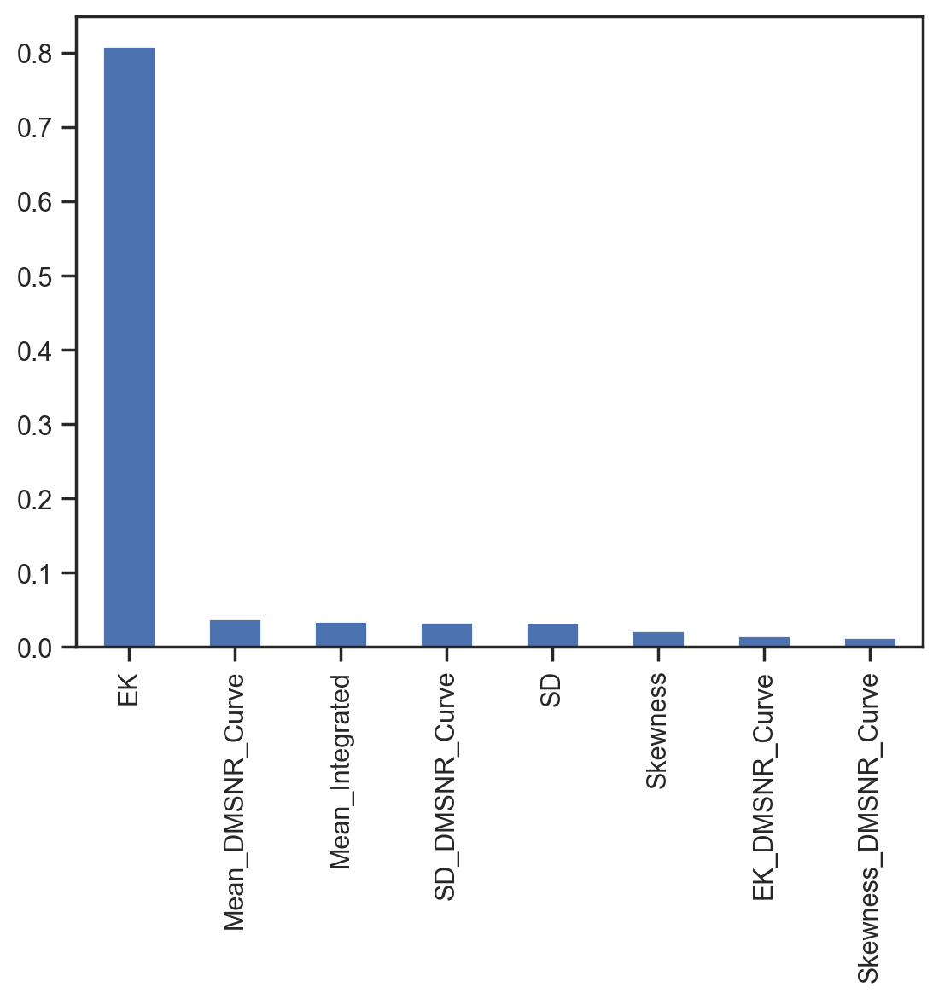

In [85]:
pd.Series(data = clf_tree.feature_importances_, index=Pulsar.columns[:-1]).sort_values(ascending=False)[:14].plot.bar()

In [86]:
import plotly.express as px

In [87]:
px.bar(pd.Series(data = clf_tree.feature_importances_,
                 index = Pulsar.columns[:-1]).sort_values(ascending=False)[:14],
                  text_auto = True)

In [88]:
px.bar(pd.Series(data = clf_rf.feature_importances_,
                 index = Pulsar.columns[:-1]).sort_values(ascending=False)[:14],
                  text_auto = True)

In [89]:
px.bar(pd.Series(data = clf_gb.feature_importances_,
                 index = Pulsar.columns[:-1]).sort_values(ascending=False)[:14],
                  text_auto = True)

In [90]:
df_sample = pd.read_csv('C:/Users/User/Downloads/Compressed/sample_submission.csv')
df_sample

,id,Class
0,117564,0
1,117565,0
2,117566,0
3,117567,0
4,117568,0
...,...,...
78372,195936,0
78373,195937,0
78374,195938,0
78375,195939,0


In [91]:
from sklearn.preprocessing import MinMaxScaler

In [92]:
Pulsar_normalized = Pulsar.copy()
Pulsar_normalized

,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve,Class
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0
...,...,...,...,...,...,...,...,...,...
17893,136.429688,59.847421,-0.187846,-0.738123,1.296823,12.166062,15.450260,285.931022,0
17894,122.554688,49.485605,0.127978,0.323061,16.409699,44.626893,2.945244,8.297092,0
17895,119.335938,59.935939,0.159363,-0.743025,21.430602,58.872000,2.499517,4.595173,0
17896,114.507812,53.902400,0.201161,-0.024789,1.946488,13.381731,10.007967,134.238910,0


In [94]:
Pulsar_normalized = MinMaxScaler().fit_transform(Pulsar_normalized)
Pulsar_normalized

array([[0.72134164, 0.41768745, 0.16504291, ..., 0.29498574, 0.06388987,
        0.        ],
       [0.51762787, 0.46090841, 0.23541516, ..., 0.36401483, 0.10844339,
        0.        ],
       [0.52034628, 0.19686832, 0.22113842, ..., 0.28862387, 0.05461031,
        0.        ],
       ...,
       [0.60771193, 0.4751437 , 0.2046521 , ..., 0.14965285, 0.00550903,
        0.        ],
       [0.58186609, 0.39361695, 0.20885482, ..., 0.34892638, 0.11418141,
        0.        ],
       [0.27435072, 0.82458965, 0.33003783, ..., 0.04091771, 0.00285542,
        0.        ]])

In [95]:
Pulsar_normalized = pd.DataFrame(Pulsar_normalized)

In [96]:
Pulsar_normalized.columns = Pulsar.columns
Pulsar_normalized

,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve,Class
0,0.721342,0.417687,0.165043,0.015627,0.013382,0.113681,0.294986,0.063890,0.0
1,0.517628,0.460908,0.235415,0.018268,0.006560,0.072524,0.364015,0.108443,0.0
2,0.520346,0.196868,0.221138,0.040677,0.013030,0.139188,0.288624,0.054610,0.0
3,0.700933,0.437884,0.181750,0.016534,0.015368,0.131583,0.266348,0.046581,0.0
4,0.443854,0.214847,0.249044,0.041712,0.004327,0.039684,0.462029,0.213369,0.0
...,...,...,...,...,...,...,...,...,...
17893,0.699218,0.473948,0.169741,0.015077,0.004855,0.046437,0.493364,0.241336,0.0
17894,0.624942,0.333936,0.201496,0.030260,0.072572,0.360761,0.161482,0.008612,0.0
17895,0.607712,0.475144,0.204652,0.015007,0.095069,0.498699,0.149653,0.005509,0.0
17896,0.581866,0.393617,0.208855,0.025283,0.007766,0.058209,0.348926,0.114181,0.0


<Axes: xlabel='Mean_Integrated', ylabel='Count'>

[Text(0.5, 0, 'Mean_Integrated')]

<Axes: ylabel='Mean_Integrated'>

[Text(0.5, 0, 'Mean_Integrated')]

<Axes: xlabel='SD', ylabel='Count'>

[Text(0.5, 0, 'SD')]

<Axes: ylabel='SD'>

[Text(0.5, 0, 'SD')]

<Axes: xlabel='EK', ylabel='Count'>

[Text(0.5, 0, 'EK')]

<Axes: ylabel='EK'>

[Text(0.5, 0, 'EK')]

<Axes: xlabel='Skewness', ylabel='Count'>

[Text(0.5, 0, 'Skewness')]

<Axes: ylabel='Skewness'>

[Text(0.5, 0, 'Skewness')]

<Axes: xlabel='Mean_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'Mean_DMSNR_Curve')]

<Axes: ylabel='Mean_DMSNR_Curve'>

[Text(0.5, 0, 'Mean_DMSNR_Curve')]

<Axes: xlabel='SD_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'SD_DMSNR_Curve')]

<Axes: ylabel='SD_DMSNR_Curve'>

[Text(0.5, 0, 'SD_DMSNR_Curve')]

<Axes: xlabel='EK_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'EK_DMSNR_Curve')]

<Axes: ylabel='EK_DMSNR_Curve'>

[Text(0.5, 0, 'EK_DMSNR_Curve')]

<Axes: xlabel='Skewness_DMSNR_Curve', ylabel='Count'>

[Text(0.5, 0, 'Skewness_DMSNR_Curve')]

<Axes: ylabel='Skewness_DMSNR_Curve'>

[Text(0.5, 0, 'Skewness_DMSNR_Curve')]

<Axes: xlabel='Class', ylabel='Count'>

[Text(0.5, 0, 'Class')]

<Axes: ylabel='Class'>

[Text(0.5, 0, 'Class')]

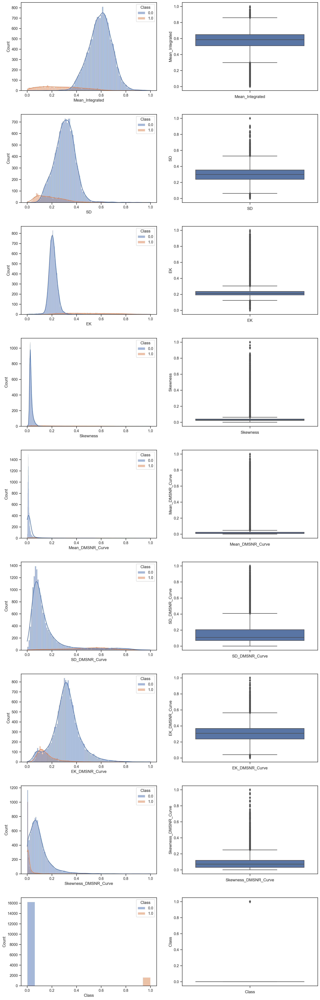

In [97]:
fig, ax = plt.subplots(nrows = len(Pulsar_normalized.columns), ncols = 2, figsize = (14,42))

for row in range(len(Pulsar_normalized.columns)):
    sns.histplot(data = Pulsar_normalized, x = Pulsar_normalized.iloc[:, row], kde = True, ax = ax[row][0], hue = 'Class')
    ax[row][0].set(xlabel = Pulsar_normalized.columns[row])

    sns.boxplot(data = Pulsar_normalized, y = Pulsar_normalized.iloc[:, row], ax = ax[row][1], hue = 'Class')
    ax[row][1].set(xlabel = Pulsar_normalized.columns[row])

plt.tight_layout(pad = 3)

In [98]:
X_normalized, y_normalized = Pulsar_normalized.iloc[:,:-1], Pulsar_normalized.iloc[:,-1]
X_train_normalized, X_test_normalized, y_train_normalized, y_test_normalized = train_test_split(X_normalized, y_normalized, train_size = 0.8, stratify = y_normalized)

In [99]:
clf_tree_normalized = DecisionTreeClassifier()
clf_tree_normalized.fit(X_train_normalized, y_train_normalized)
clf_tree_normalized.score(X_test_normalized, y_test_normalized)

clf_knn_normalized = KNeighborsClassifier()
clf_knn_normalized.fit(X_train_normalized, y_train_normalized)
clf_knn_normalized.score(X_test_normalized, y_test_normalized)

clf_gnb_normalized = GaussianNB()
clf_gnb_normalized.fit(X_train_normalized, y_train_normalized)
clf_gnb_normalized.score(X_test_normalized, y_test_normalized)

clf_svm_normalized = SVC()
clf_svm_normalized.fit(X_train_normalized, y_train_normalized)
clf_svm_normalized.score(X_test_normalized, y_test_normalized)

clf_rf_normalized = RandomForestClassifier()
clf_rf_normalized.fit(X_train_normalized, y_train_normalized)
clf_rf_normalized.score(X_test_normalized, y_test_normalized)

clf_boost_normalized = AdaBoostClassifier()
clf_boost_normalized.fit(X_train_normalized, y_train_normalized)
clf_boost_normalized.score(X_test_normalized, y_test_normalized)

clf_bag_normalized = BaggingClassifier()
clf_bag_normalized.fit(X_train_normalized, y_train_normalized)
clf_bag_normalized.score(X_test_normalized, y_test_normalized)

clf_gb_normalized = GradientBoostingClassifier()
clf_gb_normalized.fit(X_train_normalized, y_train_normalized)
clf_gb_normalized.score(X_test_normalized, y_test_normalized)

DecisionTreeClassifier()

0.9625698324022346

KNeighborsClassifier()

0.9770949720670391

GaussianNB()

0.943854748603352

SVC()

0.9762569832402235

RandomForestClassifier()

0.9779329608938547

AdaBoostClassifier()

0.9745810055865922

BaggingClassifier()

0.9784916201117319

GradientBoostingClassifier()

0.9743016759776536

In [100]:
modelsc = [lj,gnb,knnc,cartc,rfc,gbmc,xgbc,lgbmc,catbc]

In [101]:
for model in modelsc:
    name = model.__class__.__name__
    predict = model.predict(xTest)
    R2CV = cross_val_score(model,xTest,yTest,cv=10,verbose=False).mean()
    error = -cross_val_score(model,xTest,yTest,cv=10,scoring="neg_mean_squared_error",verbose=False).mean()
    roc = roc_curve(yTest,predict)
    print(name + ": ")
    print("-" * 10)
    print("ACC-->",accuracy_score(yTest,predict))
    print("R2CV-->",R2CV)
    print("MEAN SQUARED ERROR-->",np.sqrt(error))
    print("ROC-->",roc)
    print("-" * 30)

LogisticRegression: 
----------
ACC--> 0.979608938547486
R2CV--> 0.9779329608938548
MEAN SQUARED ERROR--> 0.14854978662436796
ROC--> (array([0.        , 0.00552317, 1.        ]), array([0.        , 0.82866044, 1.        ]), array([2, 1, 0], dtype=int64))
------------------------------
GaussianNB: 
----------
ACC--> 0.9474860335195531
R2CV--> 0.9488826815642458
MEAN SQUARED ERROR--> 0.22609139398870137
ROC--> (array([0.        , 0.04387849, 1.        ]), array([0.        , 0.85981308, 1.        ]), array([2, 1, 0], dtype=int64))
------------------------------
KNeighborsClassifier: 
----------
ACC--> 0.9745810055865922
R2CV--> 0.972905027932961
MEAN SQUARED ERROR--> 0.16460550436434104
ROC--> (array([0.        , 0.00889844, 1.        ]), array([0.        , 0.80685358, 1.        ]), array([2, 1, 0], dtype=int64))
------------------------------
DecisionTreeClassifier: 
----------
ACC--> 0.9706703910614525
R2CV--> 0.9681564245810057
MEAN SQUARED ERROR--> 0.17844768258230312
ROC--> (array([0

In [102]:
print("Model performance on various algorithms")
print("---------------------------------------")

clf_tree_cv_normalized = cross_val_score(DecisionTreeClassifier(), X_normalized, y_normalized, cv=5)
print("Decision tree",round(np.mean(clf_tree_cv_normalized), 4) * 100,"%")
print()

clf_knn_cv_normalized = cross_val_score(KNeighborsClassifier(), X_normalized, y_normalized, cv=5)
print("kNN",round(np.mean(clf_knn_cv_normalized), 4) * 100,"%")
print()

clf_gnb_cv_normalized = cross_val_score(GaussianNB(), X_normalized, y_normalized, cv=5)
print("GNB",round(np.mean(clf_gnb_cv_normalized), 4) * 100,"%")
print()

clf_svm_cv_normalized = cross_val_score(SVC(), X_normalized, y_normalized, cv=5)
print("SVM",round(np.mean(clf_svm_cv_normalized), 4) * 100,"%")
print()

clf_rf_cv_normalized = cross_val_score(RandomForestClassifier() , X_normalized, y_normalized, cv=5)
print("Random forests",round(np.mean(clf_rf_cv_normalized), 4) * 100,"%")
print()

clf_bag_cv_normalized = cross_val_score(BaggingClassifier() , X_normalized, y_normalized, cv=5)
print("Bagging",round(np.mean(clf_bag_cv_normalized), 4) * 100,"%")
print()

clf_boost_cv_normalized = cross_val_score(AdaBoostClassifier() , X_normalized, y_normalized, cv=5)
print("Ada boost",round(np.mean(clf_boost_cv_normalized), 4) * 100,"%")
print()

clf_grad_boost_cv_normalized = cross_val_score(GradientBoostingClassifier() , X_normalized, y_normalized, cv=5)
print("Gradient boosting",round(np.mean(clf_grad_boost_cv_normalized), 4) * 100,"%")
print()

Model performance on various algorithms
---------------------------------------
Decision tree 96.66 %

kNN 97.72999999999999 %

GNB 94.39999999999999 %

SVM 97.74000000000001 %

Random forests 97.88 %

Bagging 97.61999999999999 %

Ada boost 97.77 %

Gradient boosting 97.7 %



In [103]:
scores_normalized = pd.DataFrame({
                        "Normalized - CV": [
                                  round(np.mean(clf_tree_cv_normalized), 4) * 100,
                                  round(np.mean(clf_knn_cv_normalized), 4) * 100,
                                  round(np.mean(clf_gnb_cv_normalized), 4) * 100,
                                  round(np.mean(clf_svm_cv_normalized), 4) * 100,
                                  round(np.mean(clf_rf_cv_normalized), 4) * 100,
                                  round(np.mean(clf_bag_cv_normalized), 4) * 100,
                                  round(np.mean(clf_boost_cv_normalized), 4) * 100,
                                  round(np.mean(clf_grad_boost_cv_normalized), 4) * 100
                                 ],
                        "Normalized - pulsar-test-split": [
                              round(clf_tree_normalized.score(X_test_normalized, y_test_normalized), 4) * 100,
                              round(clf_knn_normalized.score(X_test_normalized, y_test_normalized), 4) * 100,
                              round(clf_gnb_normalized.score(X_test_normalized, y_test_normalized), 4) * 100,
                              round(clf_svm_normalized.score(X_test_normalized, y_test_normalized), 4) * 100,
                              round(clf_rf_normalized.score(X_test_normalized, y_test_normalized), 4) * 100,
                              round(clf_bag_normalized.score(X_test_normalized, y_test_normalized), 4) * 100,
                              round(clf_boost_normalized.score(X_test_normalized, y_test_normalized), 4) * 100,
                              round(clf_gb_normalized.score(X_test_normalized, y_test_normalized), 4) * 100,
                             ]
                        },
                        index = ["Decision Tree", "kNN", "GNB", "SVM" , "Random forests", "Bagging", "Ada Boost", "Gradient Boosting"] )
scores_normalized

,Normalized - CV,Normalized - pulsar-test-split
Decision Tree,96.66,96.26
kNN,97.73,97.71
GNB,94.40,94.39
SVM,97.74,97.63
Random forests,97.88,97.79
Bagging,97.62,97.85
Ada Boost,97.77,97.46
Gradient Boosting,97.70,97.43


In [104]:
scores_final = scores.join(scores_normalized)
scores_final

,Plain - CV,Plain - pulsar-test-split,Normalized - CV,Normalized - pulsar-test-split
Decision Tree,96.66,96.31,96.66,96.26
kNN,97.11,96.90,97.73,97.71
GNB,94.40,94.44,94.40,94.39
SVM,97.22,97.15,97.74,97.63
Random forests,97.84,97.79,97.88,97.79
Bagging,97.77,97.82,97.62,97.85
Ada Boost,97.77,97.74,97.77,97.46
Gradient Boosting,97.75,97.54,97.70,97.43


Text(0.5, 0, 'Algorithm')

Text(0, 0.5, 'Accuracy')

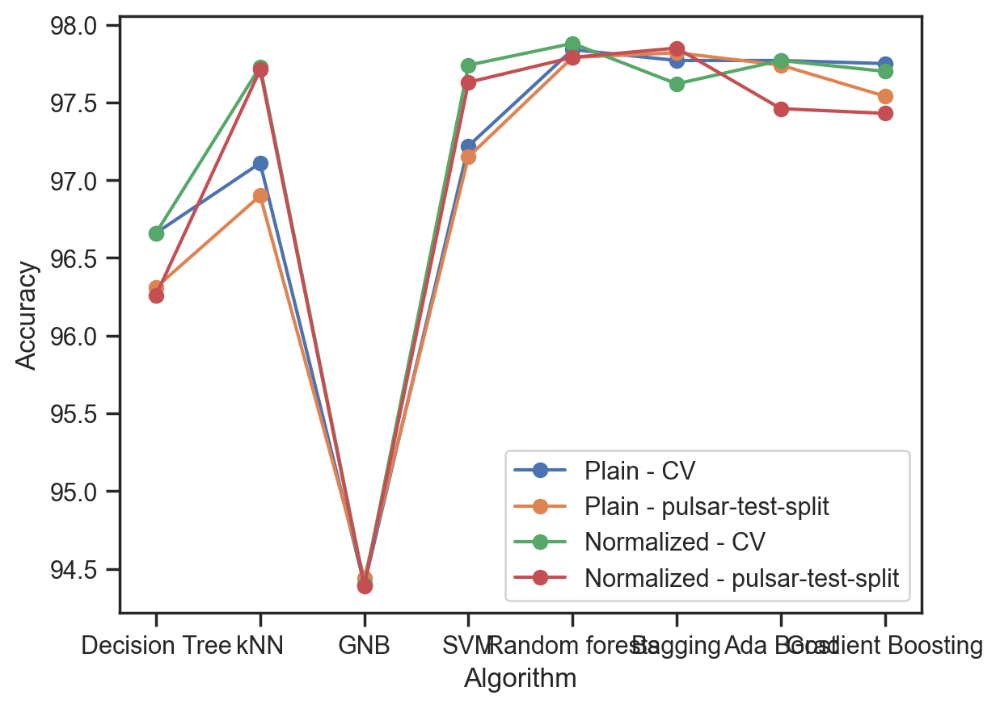

In [105]:
plt.plot(scores_final,'-o')
plt.xlabel("Algorithm")
plt.ylabel("Accuracy")
plt.legend(scores_final.columns)

<Axes: >

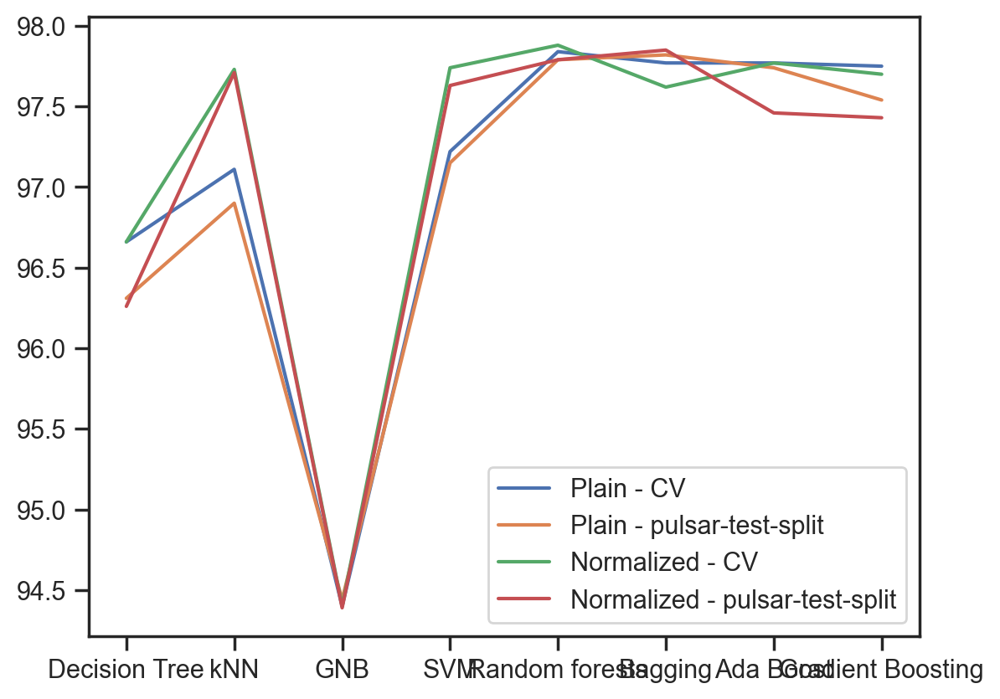

In [106]:
scores_final.plot()

In [107]:
from sklearn.preprocessing import StandardScaler

In [108]:
Pulsar_standardized = Pulsar.copy()
Pulsar_standardized

,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve,Class
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0
...,...,...,...,...,...,...,...,...,...
17893,136.429688,59.847421,-0.187846,-0.738123,1.296823,12.166062,15.450260,285.931022,0
17894,122.554688,49.485605,0.127978,0.323061,16.409699,44.626893,2.945244,8.297092,0
17895,119.335938,59.935939,0.159363,-0.743025,21.430602,58.872000,2.499517,4.595173,0
17896,114.507812,53.902400,0.201161,-0.024789,1.946488,13.381731,10.007967,134.238910,0


In [109]:
Pulsar_standardized = pd.DataFrame(StandardScaler().fit_transform(Pulsar_standardized.iloc[:,:-1])).join(Pulsar_standardized.iloc[:,-1])
Pulsar_standardized

,0,1,2,3,4,5,6,7,Class
0,1.149317,1.334832,-0.669570,-0.400459,-0.319440,-0.370625,-0.072798,-0.287438,0
1,-0.334168,1.802265,-0.011785,-0.370535,-0.371102,-0.588924,0.504427,0.211581,0
2,-0.314372,-1.053322,-0.145233,-0.116593,-0.322107,-0.235328,-0.125996,-0.391373,0
3,1.000694,1.553254,-0.513409,-0.390178,-0.304404,-0.275666,-0.312265,-0.481300,0
4,-0.871402,-0.858879,0.115609,-0.104866,-0.388010,-0.763111,1.324026,1.386794,0
...,...,...,...,...,...,...,...,...,...
17893,0.988208,1.943284,-0.625655,-0.406697,-0.384010,-0.727295,1.586054,1.700034,0
17894,0.447319,0.429062,-0.328831,-0.234643,0.128776,0.939926,-1.189159,-0.906574,0
17895,0.321842,1.956220,-0.299334,-0.407492,0.299137,1.671568,-1.288079,-0.941330,0
17896,0.133628,1.074510,-0.260050,-0.291041,-0.361967,-0.664857,0.378257,0.275850,0


In [110]:
Pulsar_standardized.columns = Pulsar.columns
Pulsar_standardized

,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve,Class
0,1.149317,1.334832,-0.669570,-0.400459,-0.319440,-0.370625,-0.072798,-0.287438,0
1,-0.334168,1.802265,-0.011785,-0.370535,-0.371102,-0.588924,0.504427,0.211581,0
2,-0.314372,-1.053322,-0.145233,-0.116593,-0.322107,-0.235328,-0.125996,-0.391373,0
3,1.000694,1.553254,-0.513409,-0.390178,-0.304404,-0.275666,-0.312265,-0.481300,0
4,-0.871402,-0.858879,0.115609,-0.104866,-0.388010,-0.763111,1.324026,1.386794,0
...,...,...,...,...,...,...,...,...,...
17893,0.988208,1.943284,-0.625655,-0.406697,-0.384010,-0.727295,1.586054,1.700034,0
17894,0.447319,0.429062,-0.328831,-0.234643,0.128776,0.939926,-1.189159,-0.906574,0
17895,0.321842,1.956220,-0.299334,-0.407492,0.299137,1.671568,-1.288079,-0.941330,0
17896,0.133628,1.074510,-0.260050,-0.291041,-0.361967,-0.664857,0.378257,0.275850,0


In [111]:
X_standard, y_standard = Pulsar_standardized.iloc[:,:-1], Pulsar_standardized.iloc[:,-1]
X_train_standard, X_test_standard, y_train_standard, y_test_standard = train_test_split(X_standard, y_standard, train_size = 0.8, stratify = y_standard)

X_standard.shape
y_standard.shape

(17898, 8)

(17898,)

In [112]:
clf_tree_standard = DecisionTreeClassifier()
clf_tree_standard.fit(X_train_standard, y_train_standard)
clf_tree_standard.score(X_test_standard, y_test_standard)

clf_knn_standard = KNeighborsClassifier()
clf_knn_standard.fit(X_train_standard, y_train_standard)
clf_knn_standard.score(X_test_standard, y_test_standard)

clf_gnb_standard = GaussianNB()
clf_gnb_standard.fit(X_train_standard, y_train_standard)
clf_gnb_standard.score(X_test_standard, y_test_standard)

clf_svm_standard = SVC()
clf_svm_standard.fit(X_train_standard, y_train_standard)
clf_svm_standard.score(X_test_standard, y_test_standard)

clf_rf_standard = RandomForestClassifier()
clf_rf_standard.fit(X_train_standard, y_train_standard)
clf_rf_standard.score(X_test_standard, y_test_standard)

clf_boost_standard = AdaBoostClassifier()
clf_boost_standard.fit(X_train_standard, y_train_standard)
clf_boost_standard.score(X_test_standard, y_test_standard)

clf_bag_standard = BaggingClassifier()
clf_bag_standard.fit(X_train_standard, y_train_standard)
clf_bag_standard.score(X_test_standard, y_test_standard)

clf_gb_standard = GradientBoostingClassifier()
clf_gb_standard.fit(X_train_standard, y_train_standard)
clf_gb_standard.score(X_test_standard, y_test_standard)

DecisionTreeClassifier()

0.9664804469273743

KNeighborsClassifier()

0.9768156424581006

GaussianNB()

0.9430167597765363

SVC()

0.9748603351955307

RandomForestClassifier()

0.9773743016759776

AdaBoostClassifier()

0.9768156424581006

BaggingClassifier()

0.9768156424581006

GradientBoostingClassifier()

0.9768156424581006

In [113]:
print("Model performance on various algorithms")
print("---------------------------------------")

clf_tree_cv_standard = cross_val_score(DecisionTreeClassifier(), X_standard, y_standard, cv=5)
print("Decision tree",round(np.mean(clf_tree_cv_standard), 4) * 100,"%")
print()

clf_knn_cv_standard = cross_val_score(KNeighborsClassifier(), X_standard, y_standard, cv=5)
print("kNN",round(np.mean(clf_knn_cv_standard), 4) * 100,"%")
print()

clf_gnb_cv_standard = cross_val_score(GaussianNB(), X_standard, y_standard, cv=5)
print("GNB",round(np.mean(clf_gnb_cv_standard), 4) * 100,"%")
print()

clf_svm_cv_standard = cross_val_score(SVC(), X_standard, y_standard, cv=5)
print("SVM",round(np.mean(clf_svm_cv_standard), 4) * 100,"%")
print()

clf_rf_cv_standard = cross_val_score(RandomForestClassifier() , X_standard, y_standard, cv=5)
print("Random forests",round(np.mean(clf_rf_cv_standard), 4) * 100,"%")
print()

clf_bag_cv_standard = cross_val_score(BaggingClassifier() , X_standard, y_standard, cv=5)
print("Bagging",round(np.mean(clf_bag_cv_standard), 4) * 100,"%")
print()

clf_boost_cv_standard = cross_val_score(AdaBoostClassifier() , X_standard, y_standard, cv=5)
print("Ada boost",round(np.mean(clf_boost_cv_standard), 4) * 100,"%")
print()

clf_grad_boost_cv_standard = cross_val_score(GradientBoostingClassifier() , X_standard, y_standard, cv=5)
print("Gradient boosting",round(np.mean(clf_grad_boost_cv_standard), 4) * 100,"%")
print()

Model performance on various algorithms
---------------------------------------
Decision tree 96.67999999999999 %

kNN 97.78 %

GNB 94.39999999999999 %

SVM 97.74000000000001 %

Random forests 97.87 %

Bagging 97.75 %

Ada boost 97.77 %

Gradient boosting 97.75 %



In [114]:
scores_standard = pd.DataFrame({
                        "Standardized - CV": [
                                  round(np.mean(clf_tree_cv_standard), 4) * 100,
                                  round(np.mean(clf_knn_cv_standard), 4) * 100,
                                  round(np.mean(clf_gnb_cv_standard), 4) * 100,
                                  round(np.mean(clf_svm_cv_standard), 4) * 100,
                                  round(np.mean(clf_rf_cv_standard), 4) * 100,
                                  round(np.mean(clf_bag_cv_standard), 4) * 100,
                                  round(np.mean(clf_boost_cv_standard), 4) * 100,
                                  round(np.mean(clf_grad_boost_cv_standard), 4) * 100
                                 ],
                        "Standardized - pulsar-test-split": [
                              round(clf_tree_standard.score(X_test_standard, y_test_standard), 4) * 100,
                              round(clf_knn_standard.score(X_test_standard, y_test_standard), 4) * 100,
                              round(clf_gnb_standard.score(X_test_standard, y_test_standard), 4) * 100,
                              round(clf_svm_standard.score(X_test_standard, y_test_standard), 4) * 100,
                              round(clf_rf_standard.score(X_test_standard, y_test_standard), 4) * 100,
                              round(clf_bag_standard.score(X_test_standard, y_test_standard), 4) * 100,
                              round(clf_boost_standard.score(X_test_standard, y_test_standard), 4) * 100,
                              round(clf_gb_standard.score(X_test_standard, y_test_standard), 4) * 100,
                             ]
                        },
                        index = ["Decision Tree", "kNN", "GNB", "SVM" , "Random forests", "Bagging", "Ada Boost", "Gradient Boosting"] )
scores_standard

,Standardized - CV,Standardized - pulsar-test-split
Decision Tree,96.68,96.65
kNN,97.78,97.68
GNB,94.40,94.30
SVM,97.74,97.49
Random forests,97.87,97.74
Bagging,97.75,97.68
Ada Boost,97.77,97.68
Gradient Boosting,97.75,97.68


In [115]:
scores_final.columns

Index(['Plain - CV', 'Plain - pulsar-test-split', 'Normalized - CV',
       'Normalized - pulsar-test-split'],
      dtype='object')

In [116]:
scores_final.join(scores_standard)

,Plain - CV,Plain - pulsar-test-split,Normalized - CV,Normalized - pulsar-test-split,Standardized - CV,Standardized - pulsar-test-split
Decision Tree,96.66,96.31,96.66,96.26,96.68,96.65
kNN,97.11,96.90,97.73,97.71,97.78,97.68
GNB,94.40,94.44,94.40,94.39,94.40,94.30
SVM,97.22,97.15,97.74,97.63,97.74,97.49
Random forests,97.84,97.79,97.88,97.79,97.87,97.74
Bagging,97.77,97.82,97.62,97.85,97.75,97.68
Ada Boost,97.77,97.74,97.77,97.46,97.77,97.68
Gradient Boosting,97.75,97.54,97.70,97.43,97.75,97.68


In [117]:
scores_final = scores_final.join(scores_standard)

Text(0.5, 0, 'Algorithm')

Text(0, 0.5, 'Accuracy')

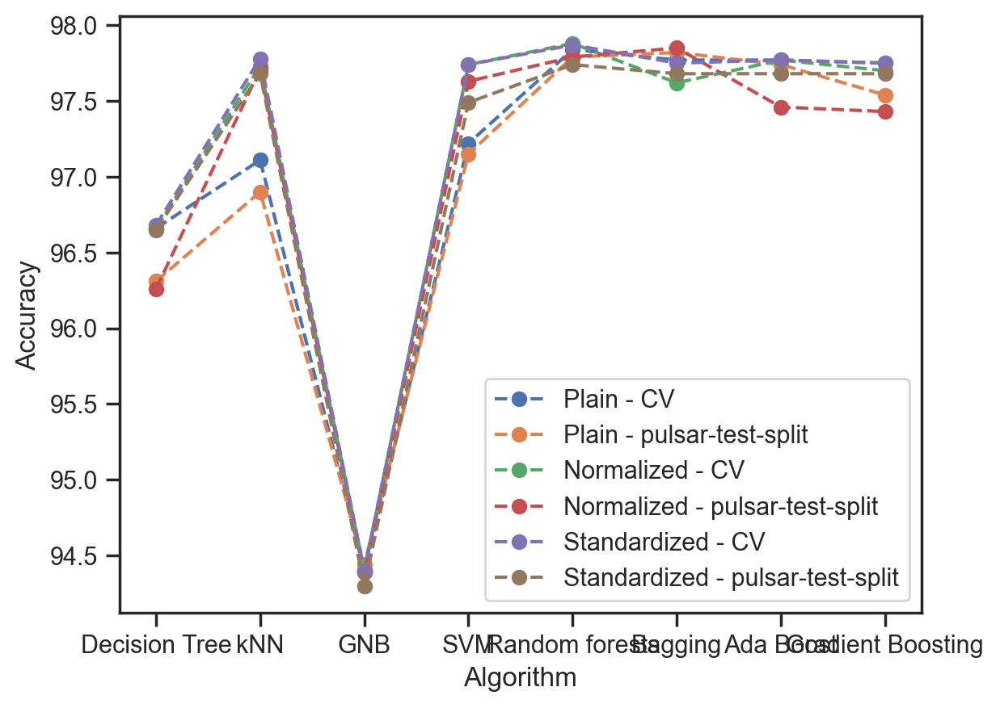

In [118]:
plt.plot(scores_final,'--o')
plt.xlabel("Algorithm")
plt.ylabel("Accuracy")
plt.legend(scores_final.columns)

<Axes: >

Text(0.5, 0, 'Algorithm')

Text(0, 0.5, 'Accuracy')

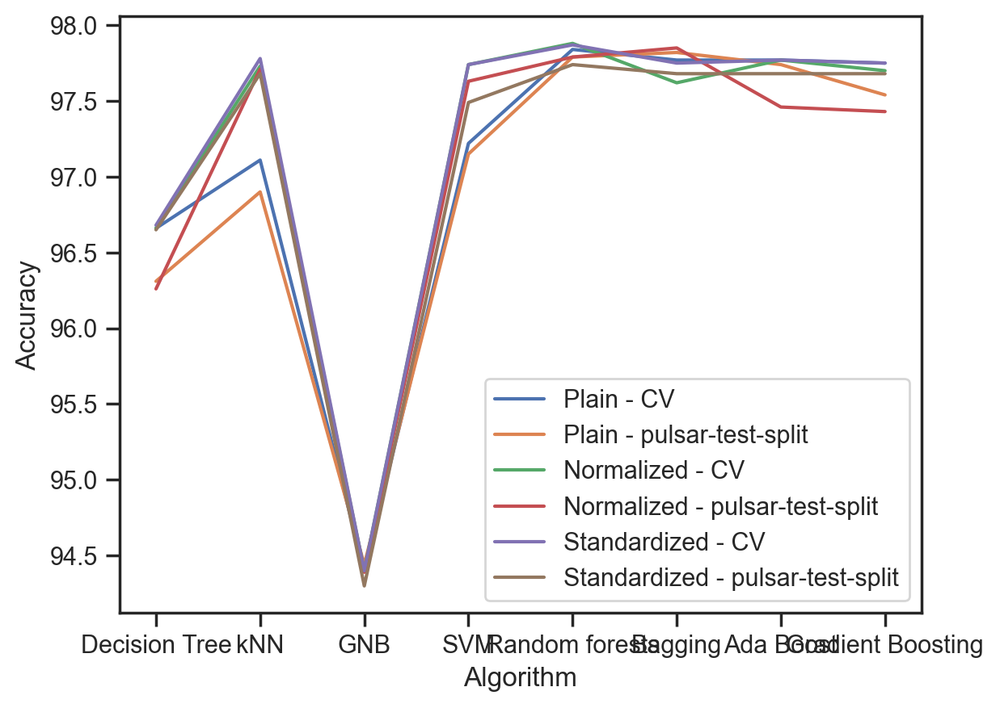

In [119]:
scores_final.plot()
plt.xlabel("Algorithm")
plt.ylabel("Accuracy")

<Axes: >

Text(0.5, 0, 'Algorithm')

Text(0, 0.5, 'Accuracy')

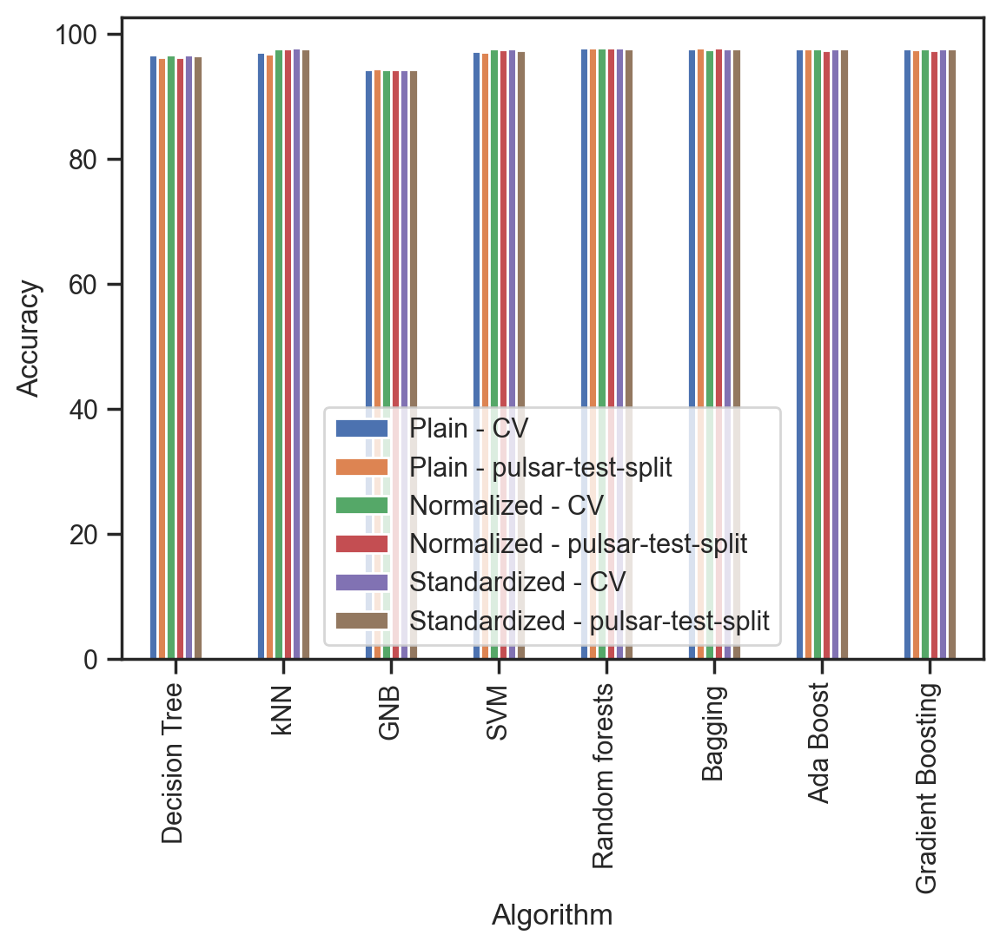

In [120]:
scores_final.plot.bar()
plt.xlabel("Algorithm")
plt.ylabel("Accuracy")

In [121]:
from sklearn.ensemble import VotingClassifier

In [122]:
clf_voting_cv = VotingClassifier(estimators = [
                                                  ('dt',clf_tree),
                                                  ('knn',clf_knn),
                                                  ('gnb',clf_gnb),
                                                  ('svm',clf_svm),
                                                  ('rf',clf_rf),
                                                  ('bag',clf_bag),
                                                  ('adaboost',clf_boost),
                                                  ('gradboost',clf_gb)
                                              ],
                                  voting = 'hard')

clf_voting_cv = cross_val_score(clf_voting_cv, Pulsar.iloc[:,:-1], Pulsar.iloc[:,-1], cv = 3)
print("Majority voting",round(np.mean(clf_voting_cv), 4) * 100,"%")
print()

Majority voting 97.66 %



In [123]:
clf_voting = VotingClassifier(estimators = [
                                              ('dt',clf_tree),
                                              ('knn',clf_knn),
                                              ('gnb',clf_gnb),
                                              ('svm',clf_svm),
                                              ('rf',clf_rf),
                                              ('bag',clf_bag),
                                              ('adaboost',clf_boost),
                                              ('gradboost',clf_gb)
                                          ],
                              voting = 'hard')
clf_voting.fit(X_pulsar, y_pulsar)
clf_voting.score(X_test, y_test)

VotingClassifier(estimators=[('dt', DecisionTreeClassifier()),
                             ('knn', KNeighborsClassifier()),
                             ('gnb', GaussianNB()), ('svm', SVC()),
                             ('rf', RandomForestClassifier()),
                             ('bag', BaggingClassifier()),
                             ('adaboost', AdaBoostClassifier()),
                             ('gradboost', GradientBoostingClassifier())])

0.9773743016759776

In [124]:
X_normalized
y_normalized

,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve
0,0.721342,0.417687,0.165043,0.015627,0.013382,0.113681,0.294986,0.063890
1,0.517628,0.460908,0.235415,0.018268,0.006560,0.072524,0.364015,0.108443
2,0.520346,0.196868,0.221138,0.040677,0.013030,0.139188,0.288624,0.054610
3,0.700933,0.437884,0.181750,0.016534,0.015368,0.131583,0.266348,0.046581
4,0.443854,0.214847,0.249044,0.041712,0.004327,0.039684,0.462029,0.213369
...,...,...,...,...,...,...,...,...
17893,0.699218,0.473948,0.169741,0.015077,0.004855,0.046437,0.493364,0.241336
17894,0.624942,0.333936,0.201496,0.030260,0.072572,0.360761,0.161482,0.008612
17895,0.607712,0.475144,0.204652,0.015007,0.095069,0.498699,0.149653,0.005509
17896,0.581866,0.393617,0.208855,0.025283,0.007766,0.058209,0.348926,0.114181


0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
17893    0.0
17894    0.0
17895    0.0
17896    0.0
17897    0.0
Name: Class, Length: 17898, dtype: float64

In [125]:
clf_voting_normalized = VotingClassifier(estimators = [
                                              ('dt_normalized',clf_tree_normalized),
                                              ('knn_normalized',clf_knn_normalized),
                                              ('gnb_normalized',clf_gnb_normalized),
                                              ('svm_normalized',clf_svm_normalized),
                                              ('rf_normalized',clf_rf_normalized),
                                              ('bag_normalized',clf_bag_normalized),
                                              ('adaboost_normalized',clf_boost_normalized),
                                              ('gradboost_normalized',clf_gb_normalized)
                                          ],
                              voting = 'hard')
clf_voting_normalized.fit(X_train_normalized, y_train_normalized)
clf_voting_normalized.score(X_test_normalized, y_test_normalized)

VotingClassifier(estimators=[('dt_normalized', DecisionTreeClassifier()),
                             ('knn_normalized', KNeighborsClassifier()),
                             ('gnb_normalized', GaussianNB()),
                             ('svm_normalized', SVC()),
                             ('rf_normalized', RandomForestClassifier()),
                             ('bag_normalized', BaggingClassifier()),
                             ('adaboost_normalized', AdaBoostClassifier()),
                             ('gradboost_normalized',
                              GradientBoostingClassifier())])

0.975977653631285

In [126]:
clf_voting_cv_standard = VotingClassifier(estimators = [
                                              ('dt_standard', clf_tree_standard),
                                              ('knn_standard', clf_knn_standard),
                                              ('gnb_standard', clf_gnb_standard),
                                              ('svm_standard', clf_svm_standard),
                                              ('rf_standard', clf_rf_standard),
                                              ('bag_standard', clf_bag_standard),
                                              ('adaboost_standard', clf_boost_standard),
                                              ('gradboost_standard', clf_gb_standard)
                                          ],
                              voting = 'hard')
clf_voting_cv_standard = cross_val_score(clf_voting_cv_standard, X_standard, y_standard, cv = 3)
print("Majority voting CV_standard", round(np.mean(clf_voting_cv_standard), 4) * 100,"%")
print()

Majority voting CV_standard 97.78 %



In [127]:
scores_final

,Plain - CV,Plain - pulsar-test-split,Normalized - CV,Normalized - pulsar-test-split,Standardized - CV,Standardized - pulsar-test-split
Decision Tree,96.66,96.31,96.66,96.26,96.68,96.65
kNN,97.11,96.90,97.73,97.71,97.78,97.68
GNB,94.40,94.44,94.40,94.39,94.40,94.30
SVM,97.22,97.15,97.74,97.63,97.74,97.49
Random forests,97.84,97.79,97.88,97.79,97.87,97.74
Bagging,97.77,97.82,97.62,97.85,97.75,97.68
Ada Boost,97.77,97.74,97.77,97.46,97.77,97.68
Gradient Boosting,97.75,97.54,97.70,97.43,97.75,97.68


In [128]:
clf_voting.score(X_test, y_test)
clf_voting_normalized.score(X_test_normalized, y_test_normalized)

0.9773743016759776

0.975977653631285

In [129]:
round(np.mean(clf_voting_cv), 4) * 100
round(np.mean(clf_voting_cv_standard), 4) * 100

97.66

97.78

In [130]:
scores_final.columns

Index(['Plain - CV', 'Plain - pulsar-test-split', 'Normalized - CV',
       'Normalized - pulsar-test-split', 'Standardized - CV',
       'Standardized - pulsar-test-split'],
      dtype='object')

In [131]:
scores_final

,Plain - CV,Plain - pulsar-test-split,Normalized - CV,Normalized - pulsar-test-split,Standardized - CV,Standardized - pulsar-test-split
Decision Tree,96.66,96.31,96.66,96.26,96.68,96.65
kNN,97.11,96.90,97.73,97.71,97.78,97.68
GNB,94.40,94.44,94.40,94.39,94.40,94.30
SVM,97.22,97.15,97.74,97.63,97.74,97.49
Random forests,97.84,97.79,97.88,97.79,97.87,97.74
Bagging,97.77,97.82,97.62,97.85,97.75,97.68
Ada Boost,97.77,97.74,97.77,97.46,97.77,97.68
Gradient Boosting,97.75,97.54,97.70,97.43,97.75,97.68


In [132]:
scores_final.index = ["Decision Tree",
                     "kNN",
                     "GNB",
                     "SVM",
                     "Random forests",
                     "Bagging",
                     "Gradient Boosting",
                     "Majority Voting"]
scores_final

,Plain - CV,Plain - pulsar-test-split,Normalized - CV,Normalized - pulsar-test-split,Standardized - CV,Standardized - pulsar-test-split
Decision Tree,96.66,96.31,96.66,96.26,96.68,96.65
kNN,97.11,96.90,97.73,97.71,97.78,97.68
GNB,94.40,94.44,94.40,94.39,94.40,94.30
SVM,97.22,97.15,97.74,97.63,97.74,97.49
Random forests,97.84,97.79,97.88,97.79,97.87,97.74
Bagging,97.77,97.82,97.62,97.85,97.75,97.68
Gradient Boosting,97.77,97.74,97.77,97.46,97.77,97.68
Majority Voting,97.75,97.54,97.70,97.43,97.75,97.68


In [133]:
scores_final.loc[ 'Majority Voting', 'Plain - pulsar-test-split'] = scores_final.loc[ 'Majority Voting', 'Plain - pulsar-test-split'] * 100
scores_final.loc[ 'Majority Voting', 'Normalized - pulsar-test-split'] = scores_final.loc[ 'Majority Voting', 'Normalized - pulsar-test-split'] * 100
scores_final.loc[ 'Majority Voting', 'Standardized - pulsar-test-split'] = scores_final.loc[ 'Majority Voting', 'Standardized - pulsar-test-split'] * 100

In [134]:
scores_final

,Plain - CV,Plain - pulsar-test-split,Normalized - CV,Normalized - pulsar-test-split,Standardized - CV,Standardized - pulsar-test-split
Decision Tree,96.66,96.31,96.66,96.26,96.68,96.65
kNN,97.11,96.90,97.73,97.71,97.78,97.68
GNB,94.40,94.44,94.40,94.39,94.40,94.30
SVM,97.22,97.15,97.74,97.63,97.74,97.49
Random forests,97.84,97.79,97.88,97.79,97.87,97.74
Bagging,97.77,97.82,97.62,97.85,97.75,97.68
Gradient Boosting,97.77,97.74,97.77,97.46,97.77,97.68
Majority Voting,97.75,9754.00,97.70,9743.00,97.75,9768.00


In [135]:
scores_final.style.highlight_max()

,Plain - CV,Plain - pulsar-test-split,Normalized - CV,Normalized - pulsar-test-split,Standardized - CV,Standardized - pulsar-test-split
Decision Tree,96.660000,96.310000,96.660000,96.260000,96.680000,96.650000
kNN,97.110000,96.900000,97.730000,97.710000,97.780000,97.680000
GNB,94.400000,94.440000,94.400000,94.390000,94.400000,94.300000
SVM,97.220000,97.150000,97.740000,97.630000,97.740000,97.490000
Random forests,97.840000,97.790000,97.880000,97.790000,97.870000,97.740000
Bagging,97.770000,97.820000,97.620000,97.850000,97.750000,97.680000
Gradient Boosting,97.770000,97.740000,97.770000,97.460000,97.770000,97.680000
Majority Voting,97.750000,9754.000000,97.700000,9743.000000,97.750000,9768.000000


In [136]:
scores_final.T.style.highlight_max()

,Decision Tree,kNN,GNB,SVM,Random forests,Bagging,Gradient Boosting,Majority Voting
Plain - CV,96.660000,97.110000,94.400000,97.220000,97.840000,97.770000,97.770000,97.750000
Plain - pulsar-test-split,96.310000,96.900000,94.440000,97.150000,97.790000,97.820000,97.740000,9754.000000
Normalized - CV,96.660000,97.730000,94.400000,97.740000,97.880000,97.620000,97.770000,97.700000
Normalized - pulsar-test-split,96.260000,97.710000,94.390000,97.630000,97.790000,97.850000,97.460000,9743.000000
Standardized - CV,96.680000,97.780000,94.400000,97.740000,97.870000,97.750000,97.770000,97.750000
Standardized - pulsar-test-split,96.650000,97.680000,94.300000,97.490000,97.740000,97.680000,97.680000,9768.000000


<Axes: >

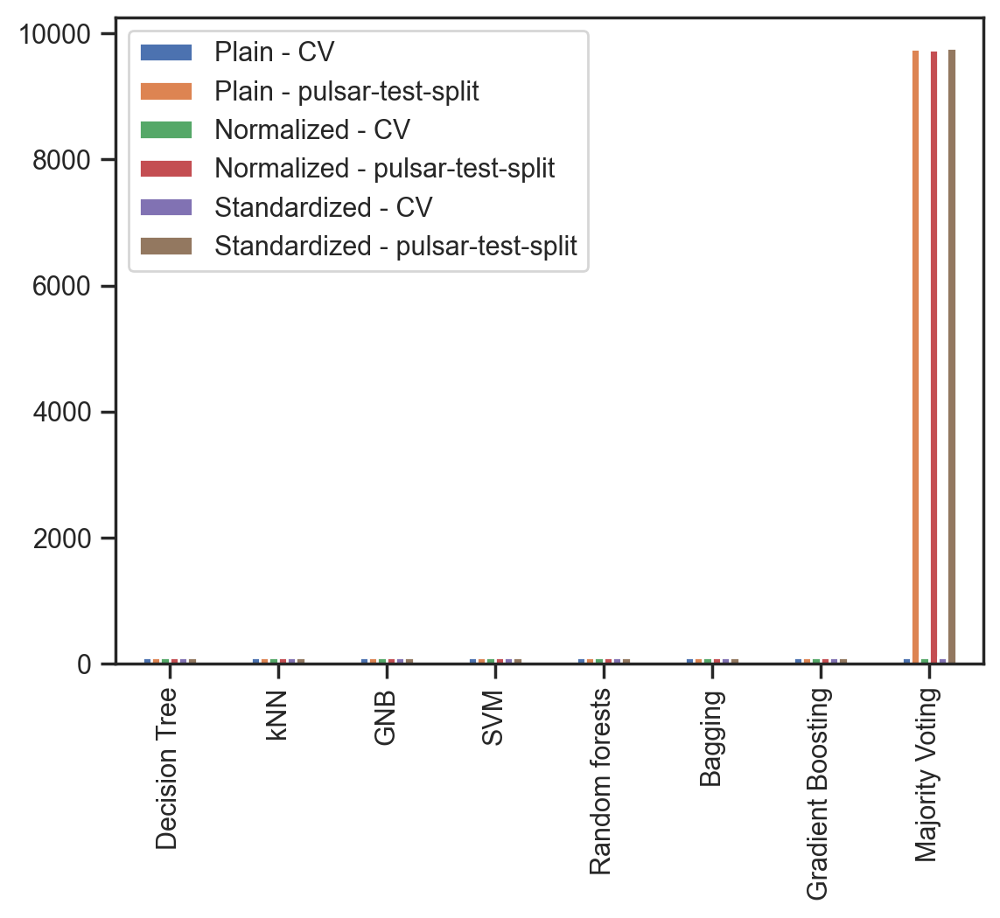

In [137]:
scores_final.plot.bar()

In [138]:
df_test = pd.read_csv('C:/Users/User/Downloads/Compressed/test.csv')
df_test

,id,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve
0,117564,140.046875,54.507800,0.058862,-0.567263,2.337793,14.868335,9.591760,117.988781
1,117565,107.828125,51.578965,0.284368,-0.338430,1.574415,12.501437,11.694968,182.704822
2,117566,135.062500,49.812343,-0.087784,-0.094341,3.576923,21.243336,7.252386,59.021499
3,117567,112.812500,41.926647,0.519921,1.287762,6.669732,29.013153,5.097661,27.105240
4,117568,96.210938,35.322620,0.481286,2.443080,2.218227,17.041064,9.766006,117.131775
...,...,...,...,...,...,...,...,...,...
78372,195936,119.328125,46.449223,0.227636,0.161986,1.120401,13.883072,14.153556,213.485463
78373,195937,125.835938,43.986678,0.078460,0.077917,2.342809,13.008583,9.907167,136.815454
78374,195938,131.789062,43.493074,0.049140,0.402859,2.116221,14.639555,10.898768,147.929016
78375,195939,79.476562,42.579993,0.817383,1.818474,1.903010,15.844982,10.723755,143.273847


In [139]:
scores_final.style.highlight_max()
scores_final.T.style.highlight_max()

,Plain - CV,Plain - pulsar-test-split,Normalized - CV,Normalized - pulsar-test-split,Standardized - CV,Standardized - pulsar-test-split
Decision Tree,96.660000,96.310000,96.660000,96.260000,96.680000,96.650000
kNN,97.110000,96.900000,97.730000,97.710000,97.780000,97.680000
GNB,94.400000,94.440000,94.400000,94.390000,94.400000,94.300000
SVM,97.220000,97.150000,97.740000,97.630000,97.740000,97.490000
Random forests,97.840000,97.790000,97.880000,97.790000,97.870000,97.740000
Bagging,97.770000,97.820000,97.620000,97.850000,97.750000,97.680000
Gradient Boosting,97.770000,97.740000,97.770000,97.460000,97.770000,97.680000
Majority Voting,97.750000,9754.000000,97.700000,9743.000000,97.750000,9768.000000


,Decision Tree,kNN,GNB,SVM,Random forests,Bagging,Gradient Boosting,Majority Voting
Plain - CV,96.660000,97.110000,94.400000,97.220000,97.840000,97.770000,97.770000,97.750000
Plain - pulsar-test-split,96.310000,96.900000,94.440000,97.150000,97.790000,97.820000,97.740000,9754.000000
Normalized - CV,96.660000,97.730000,94.400000,97.740000,97.880000,97.620000,97.770000,97.700000
Normalized - pulsar-test-split,96.260000,97.710000,94.390000,97.630000,97.790000,97.850000,97.460000,9743.000000
Standardized - CV,96.680000,97.780000,94.400000,97.740000,97.870000,97.750000,97.770000,97.750000
Standardized - pulsar-test-split,96.650000,97.680000,94.300000,97.490000,97.740000,97.680000,97.680000,9768.000000


In [140]:
pred_y = clf_rf.predict(df_test.drop(['id'], axis = 1))
pred_y

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [141]:
submission = pd.DataFrame({"id": df_test.loc[:,'id'].values,
               "Class": pred_y
              })
submission

,id,Class
0,117564,0
1,117565,0
2,117566,0
3,117567,0
4,117568,0
...,...,...
78372,195936,0
78373,195937,0
78374,195938,0
78375,195939,0


In [142]:
submission.to_csv('C:/Users/User/Downloads/Compressed/sample_submission.csv', index=None)

In [143]:
np.bincount(pred_y)

array([71620,  6757], dtype=int64)

In [144]:
df_test_gb = df_test.copy()
df_test_gb.columns = df_test.columns

clf_gb_pred = clf_gb.predict(df_test_gb.drop(['id'], axis = 1))
clf_gb_pred

df_sample_gb = pd.read_csv('C:/Users/User/Downloads/Compressed/sample_submission.csv')
df_sample_gb

df_sample_gb['Class'] = clf_gb_pred
df_sample_gb

df_sample_gb.to_csv('C:/Users/User/Downloads/Compressed/sample_submission.csv', index=None)

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

,id,Class
0,117564,0
1,117565,0
2,117566,0
3,117567,0
4,117568,0
...,...,...
78372,195936,0
78373,195937,0
78374,195938,0
78375,195939,0


,id,Class
0,117564,0
1,117565,0
2,117566,0
3,117567,0
4,117568,0
...,...,...
78372,195936,0
78373,195937,0
78374,195938,0
78375,195939,0


In [145]:
scaler = StandardScaler().fit(xTrain,yTrain)
xRTrain = scaler.transform(xTrain)
xRTest = scaler.transform(xTest)

In [146]:
mlpc = MLPClassifier().fit(xRTrain,yTrain)
predict = mlpc.predict(xRTest)

R2CV = cross_val_score(mlpc,xRTest,yTest,cv=10).mean()
print(R2CV)
error = mean_squared_error(yTest,predict)
print(np.sqrt(error))

0.9801675977653632
0.13983230179646736


<Axes: >

(array([  2.,  31., 122., 205., 301., 205.,  99.,  31.,   3.,   1.]),
 array([-3.2803276 , -2.55643457, -1.83254154, -1.10864851, -0.38475548,
         0.33913755,  1.06303058,  1.78692361,  2.51081664,  3.23470967,
         3.9586027 ]),
 <BarContainer object of 10 artists>)

<Axes: >

(array([  5.,  25.,  43., 121., 200., 236., 204.,  95.,  55.,  16.]),
 array([-3.17346164, -2.58437685, -1.99529206, -1.40620727, -0.81712249,
        -0.2280377 ,  0.36104709,  0.95013188,  1.53921667,  2.12830146,
         2.71738624]),
 <BarContainer object of 10 artists>)

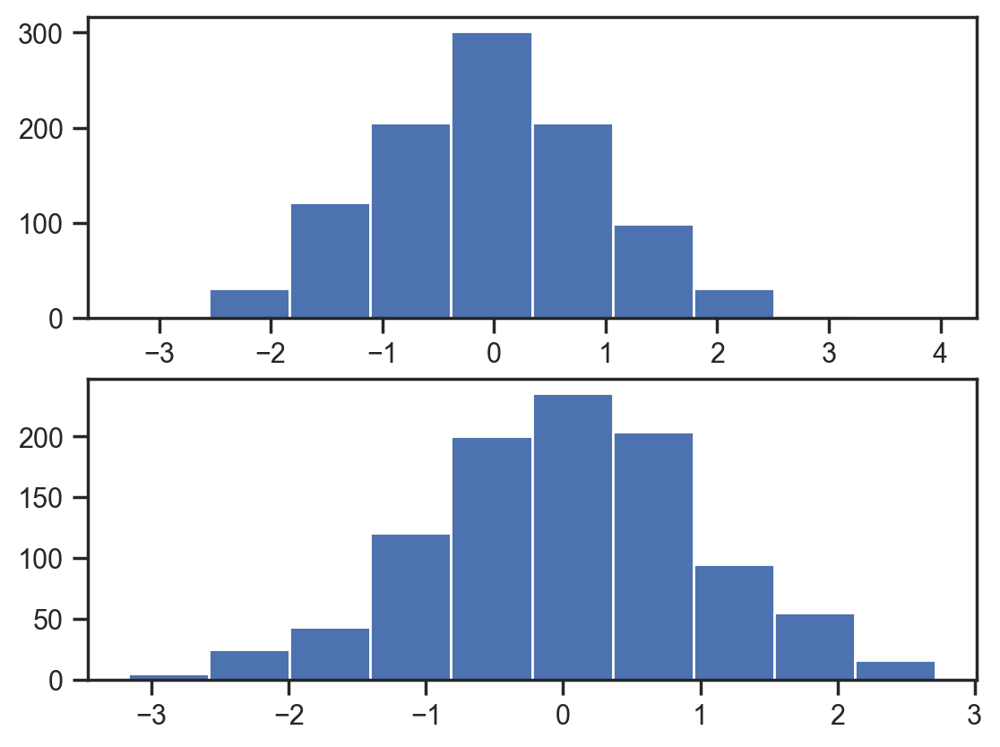

(array([ 10.,  45., 135., 226., 254., 203.,  84.,  32.,   9.,   2.]),
 array([-436.17741711, -335.02918648, -233.88095586, -132.73272523,
         -31.58449461,   69.56373602,  170.71196664,  271.86019727,
         373.00842789,  474.15665852,  575.30488914]),
 <BarContainer object of 10 artists>)

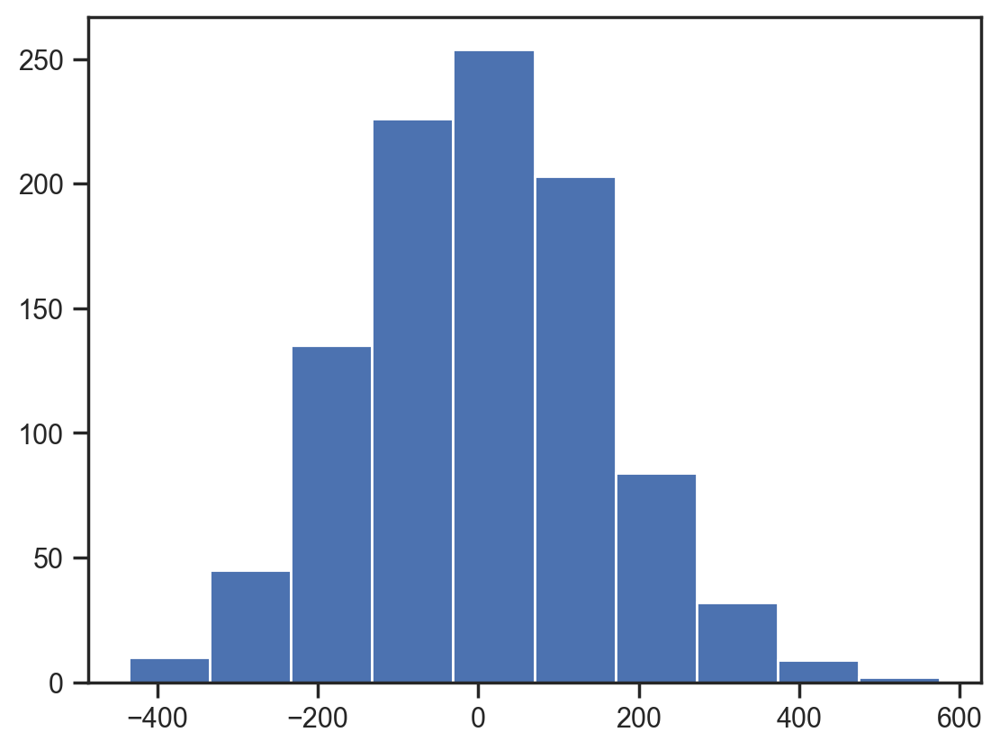

In [165]:
# regression predictive modeling problem
from sklearn.datasets import make_regression
from matplotlib import pyplot
# generate regression dataset
X, y = make_regression(n_samples=1000, n_features=20, noise=0.1, random_state=1)
# histograms of input variables
pyplot.subplot(211)
pyplot.hist(X[:, 0])
pyplot.subplot(212)
pyplot.hist(X[:, 1])
pyplot.show()
# histogram of target variable
pyplot.hist(y)
pyplot.show()